# Team Mavericks || <span style="color:lightblue; font-weight:bold;">Adil Rehman, Minh Huy Pham, Hassan Ikram, Charles</span>
Dataset of vehicles sold in May 2023

Some adverts were sold, others disappear for other reasons, such as being sent to a dealer-to-dealer auction

Predict 'days_to_sell' 

In [7]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import skew, kurtosis

from bokeh.plotting import figure, show
from bokeh.layouts import gridplot
from bokeh.models import ColumnDataSource, HoverTool
from bokeh.io import output_notebook
import geopandas as gpd
import altair as alt
import plotly.express as px
import plotly.graph_objects as go
import missingno as msno
from statsmodels.stats.outliers_influence import variance_inflation_factor
import networkx as nx
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.cluster import KMeans
from nltk.sentiment import SentimentIntensityAnalyzer
from sklearn.impute import SimpleImputer
from scipy.stats import zscore
from category_encoders.cat_boost import CatBoostEncoder
from sklearn.experimental import enable_iterative_imputer
import re
from sklearn.impute import IterativeImputer
import plotly.figure_factory as ff
import requests


In [8]:

base_url = "https://raw.githubusercontent.com/4REHMA70/auto-trader/main/GB_Postcodes"
paths = ["/PostalArea.shp", "/PostalArea.dbf", "/PostalArea.prj", "/PostalArea.qix", "/PostalArea.qml", "/PostalArea.qpj", "/PostalArea.shx"]

for path in paths:
    response = requests.get(base_url + path)
    print(f"Downloaded {path}: {response.status_code==200}")
    
    with open(f".{path}", 'wb') as file:
        file.write(response.content)


Downloaded /PostalArea.shp: True
Downloaded /PostalArea.dbf: True
Downloaded /PostalArea.prj: True
Downloaded /PostalArea.qix: True
Downloaded /PostalArea.qml: True
Downloaded /PostalArea.qpj: True
Downloaded /PostalArea.shx: True


In [9]:
df = pd.read_parquet("https://raw.githubusercontent.com/4REHMA70/auto-trader/main/Data/rate_of_sale_may_2023.snappy.parquet" ) 

dict_df = pd.read_csv("https://raw.githubusercontent.com/4REHMA70/auto-trader/main/Data/rate_of_sale_data_dict.csv") 

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 224555 entries, 0 to 224554
Data columns (total 42 columns):
 #   Column                                           Non-Null Count   Dtype  
---  ------                                           --------------   -----  
 0   stock_item_id                                    224555 non-null  object 
 1   last_date_seen                                   224555 non-null  object 
 2   first_date_seen                                  224555 non-null  object 
 3   days_to_sell                                     224555 non-null  int32  
 4   first_retailer_asking_price                      224555 non-null  int64  
 5   last_retailer_asking_price                       223626 non-null  float64
 6   can_home_deliver                                 224555 non-null  bool   
 7   reviews_per_100_advertised_stock_last_12_months  191289 non-null  float64
 8   segment                                          224523 non-null  object 
 9   seats          

In [11]:
df.head()

,stock_item_id,last_date_seen,first_date_seen,days_to_sell,first_retailer_asking_price,last_retailer_asking_price,can_home_deliver,reviews_per_100_advertised_stock_last_12_months,segment,seats,...,odometer_reading_miles,first_registration_date,attention_grabber,manufacturer_approved,price_indicator_rating,adjusted_retail_amount_gbp,predicted_mileage,number_of_images,advert_quality,postcode_area
0,52ae009b671ab58b3d4ff109a9fbdcf8d847de0fa190e1...,2023-05-05,2021-03-25,771,6995,6495.0,False,3.9,Independent,5.0,...,65000,2004-05-07,*IMMACULATE**FULL HISTORY*,False,NOANALYSIS,NaN,NaN,50,NaN,AL
1,32b1bac6934b1f64ff43cffa9df5aa296ead8143c36f9f...,2023-05-09,2021-05-25,714,13725,14995.0,False,NaN,Franchise,5.0,...,16018,2019-11-30,Sports Styling | Great Economy,True,GOOD,14848.0,26078.0,15,57.0,HP
2,21703d22d87eaa95c4dc81a60ba2c8cbe3b90ab659292c...,2023-05-12,2021-11-26,532,15499,13999.0,False,0.2,Independent,5.0,...,31093,2018-03-08,"Sat Nav,Leather,Auto,Euro 6",False,GREAT,14571.0,34732.0,22,61.0,SR
3,661acafc271373946cea7d30ac7f34257404ab89a1ad33...,2023-05-16,2022-02-17,453,10995,9995.0,False,7.9,Franchise,5.0,...,79000,2015-07-02,Viewing by APPOINTMENT ONLY,False,FAIR,9349.0,65684.0,30,61.0,FY
4,638216dc92410d965b416fea5b3cec9ca903368795fdde...,2023-05-04,2022-03-21,409,46000,37500.0,False,6.8,Franchise,5.0,...,10214,2022-03-03,Reserve Online,True,GOOD,37055.0,11765.0,22,48.0,LE


In [12]:
pd.set_option('display.max_columns', None)
pd.set_option('display.expand_frame_repr', False)
pd.set_option('max_colwidth', None)

dict_df

,Field,Description
0,stock_item_id,Unique ID of the advert e.g. 8a42801e86dad35a0186dd181f956cb5
1,last_date_seen,The date the vehicle was last seen advertised on Auto Trader e.g. 2023-01-31
2,first_date_seen,The first date the vehicle was listed on Auto Trader
3,days_to_sell,The difference in days between first_date_seen and last_date_seen
4,first_retailer_asking_price,The price the advert had when first created. This may have been a temp holding price before it went live.
5,last_retailer_asking_price,The last seen price
6,can_home_deliver,This advert is able to be delivered to the buyers home
7,reviews_per_100_advertised_stock_last_12_months,"How many reviews the seller has recieved in the last 12 months per 100 stock advertised, i.e. 200 stock advertised over the whole year, 150 reviews 150/2= 75"
8,segment,Whether the seller is a Franchise or Independent retailer
9,seats,Number of seats in the vehicle


No duplicates found by stock_item_id alone 

In [13]:
df.duplicated(subset=['stock_item_id'], keep=False).sum()

0

Displaying percentages of missing values in columns

In [14]:
missing_columns=[]
for column in df.columns:
    if df[column].isnull().sum() > 0:
        missing_columns.append(column)

print("Percentages of missing values\n")
for column in missing_columns:
    percentage_missing = (df[column].isnull().sum() / df.shape[0]) * 100
    print(f"{column}: {percentage_missing:.2f}%")

Percentages of missing values

last_retailer_asking_price: 0.41%
reviews_per_100_advertised_stock_last_12_months: 14.81%
segment: 0.01%
seats: 0.06%
doors: 0.00%
co2_emission_gpkm: 0.05%
top_speed_mph: 0.29%
zero_to_sixty_mph_seconds: 63.75%
engine_power_bhp: 0.00%
fuel_economy_wltp_combined_mpg: 3.06%
battery_range_miles: 95.07%
battery_usable_capacity_kwh: 95.07%
length_mm: 0.18%
boot_space_seats_up_litres: 3.21%
insurance_group: 0.32%
plate: 0.00%
drivetrain: 0.00%
colour: 0.92%
first_registration_date: 0.02%
attention_grabber: 9.14%
adjusted_retail_amount_gbp: 3.64%
predicted_mileage: 3.50%
advert_quality: 19.56%
postcode_area: 0.01%


- Some columns like battery_range_miles and battery_usable_capacity_kwh exceed 40% threshold greatly, and so are dropped later.
- zero_to_sixty_mph_seconds also exceeds 40% threshold, but has predictable values by make and model, and is so replaced with according medians later.
- advert quality values are missing in great quantities as well and hence may distort predictions, but doesn't justify dropping.


____________________
# <span style="color:skyblue; font-weight:bold;">Data Processing</span>

Text preprocessing on attention grabber using NLTK libraries to extract: 
- Sentimentality scores
- Text lengths 
- KMeans-classified word clusters

In [15]:
columns_to_drop = ["derivative_id", "stock_item_id", "battery_usable_capacity_kwh", "battery_range_miles"]
text_processed_df = df.drop(columns=columns_to_drop, axis=1)

attention_grabbers = text_processed_df['attention_grabber']

text_processed_df['text_length'] = attention_grabbers.apply(lambda x: len(str(x)) if x is not None else 0)

sia = SentimentIntensityAnalyzer()
text_processed_df['sentiment_score'] = attention_grabbers.apply(lambda x: sia.polarity_scores(str(x))['compound'] if x is not None else 0)

vectorizer = CountVectorizer(max_features=10, stop_words='english')
word_matrix = vectorizer.fit_transform(attention_grabbers.astype(str))

kmeans = KMeans(n_clusters=3, random_state=3)

text_processed_df['cluster_id'] = kmeans.fit_predict(word_matrix)

Dropping duplicates

In [16]:
text_processed_df.duplicated().sum()
text_processed_df.drop_duplicates()
text_processed_df[['text_length','sentiment_score','cluster_id']].tail()

,text_length,sentiment_score,cluster_id
224550,28,-0.2732,1
224551,30,0.1779,1
224552,9,0.6249,1
224553,0,0.0000,1
224554,28,0.0000,2


Despite different IDs, 10 cars are shown to be exact duplicates. IDs are autogenerated per instances in database and so these duplicates are dropped.
New extracted features displayed.

In [17]:
text_processed_df['derivative'].unique().tolist()

['2.0 16v Renaultsport 3dr',
 '1.0T EcoBoost ST-Line Euro 6 (s/s) 5dr',
 '1.0 T-GDI Exclusive Auto Euro 6 5dr',
 '2.0 TDCi Titanium 2WD Euro 6 (s/s) 5dr',
 '2.0 TDI 40 Black Edition S Tronic Euro 6 (s/s) 4dr',
 '1.4 Look 3dr',
 '1.0T EcoBoost Titanium X Euro 6 (s/s) 5dr',
 '2.0 TDI Sport S Tronic quattro Euro 6 (s/s) 5dr',
 '4.0 V8 GT S Auto 4WD Euro 6 2dr',
 '1.5 TSI EVO SE Nav Euro 6 (s/s) 5dr',
 '3.0 TDI V6 Tiptronic quattro Euro 6 (s/s) 5dr',
 '2.5 TD5 XS 5dr',
 '50kWh Elite Nav Premium Auto 5dr (7.4Kw Charger)',
 '1.5 VTi-TECH Exclusive Nav Euro 6 (s/s) 5dr',
 '2.0 C200 AMG Line Cabriolet G-Tronic+ Euro 6 (s/s) 2dr',
 '3.0 340i M Sport Auto Euro 6 (s/s) 4dr',
 '2.0h T8 Recharge 18.8kWh Plus Bright Auto AWD Euro 6 (s/s) 4dr',
 '2.0 TDI BlueMotion Tech R-Line Euro 6 (s/s) 4dr',
 '2.0 TDI BlueMotion Tech SE DSG Euro 5 (s/s) 5dr',
 '1.0 Boosterjet SZ-T Euro 6 5dr',
 '2.0 TDI BlueMotion Tech Alltrack 4Motion Euro 5 (s/s) 5dr',
 '50kWh Allure Premium Auto 5dr (7kW Charger)',
 '1.6 GDi S

Columns whose data types were changed:
- last_date_seen
- first_date_seen
- first_registration_date
- seats
- doors
- insurance_group
- length_mm
- engine_power_bhp
- fuel_economy_wltp_combined_mpg


In [18]:
date_columns = ['last_date_seen', 'first_date_seen', 'first_registration_date']
numeric_int_float_columns = ['seats', 'doors', 'insurance_group', 'length_mm', 'engine_power_bhp', 'fuel_economy_wltp_combined_mpg', 'zero_to_sixty_mph_seconds']

In [19]:
replaced_df = text_processed_df.replace('None', pd.NA)
# Replacing 'None' values with appropriate NA values for later imputation

In [20]:
for column in date_columns:
    replaced_df[column] = pd.to_datetime(replaced_df[column], errors='coerce')

for column in numeric_int_float_columns:
    replaced_df[column] = pd.to_numeric(replaced_df[column], errors='coerce')
    
    if column != 'zero_to_sixty_mph_seconds':
        replaced_df[column] = replaced_df[column].fillna(-1) # Filling with -1 to convert to appropriate datatype, then later converting back to na to impute
    
    replaced_df[column] = replaced_df[column]

In [21]:
for column in date_columns:
    print(column)
    min = replaced_df[column].min().toordinal()
    max = replaced_df[column].max().toordinal()
    print('min: ',min)
    print('max: ',max)
    print(f'The total initial range in values is: ',max-min)


last_date_seen
min:  738641
max:  738668
The total initial range in values is:  27
first_date_seen
min:  736830
max:  738667
The total initial range in values is:  1837
first_registration_date
min:  660237
max:  738667
The total initial range in values is:  78430


zero_to_sixty_mph_seconds has predictable values when factoring in make and model, and so despite a high null percentage, are replaced with medians.
Below is apparent that most make and model values for 'zero_to_sixty_mph_seconds' have predictable medians and low standard deviations. 

In [22]:
[(att[0],"std:", att[1].std(), "mean:", att[1].mean()) for att in replaced_df.groupby(['make', 'model'])['zero_to_sixty_mph_seconds']]
# As can be observed

[(('Abarth', '124 Spider'),
  'std:',
  0.05773502691896288,
  'mean:',
  6.8500000000000005),
 (('Abarth', '500'), 'std:', 0.0707106781186545, 'mean:', 7.925000000000001),
 (('Abarth', '500C'), 'std:', 0.49497474683058273, 'mean:', 7.75),
 (('Abarth', '595'), 'std:', 0.547462066918535, 'mean:', 7.397297297297297),
 (('Abarth', '595C'), 'std:', 0.4367233365956904, 'mean:', 7.445454545454546),
 (('Abarth', '695'), 'std:', nan, 'mean:', nan),
 (('Abarth', '695C'), 'std:', nan, 'mean:', 6.7),
 (('Abarth', 'Punto Evo'), 'std:', nan, 'mean:', nan),
 (('Alfa Romeo', '147'),
  'std:',
  0.9011104260855043,
  'mean:',
  9.680000000000001),
 (('Alfa Romeo', '156'), 'std:', 1.3435028842544399, 'mean:', 7.25),
 (('Alfa Romeo', '159'),
  'std:',
  0.46097722286464454,
  'mean:',
  9.133333333333333),
 (('Alfa Romeo', '159 Sportwagon'),
  'std:',
  0.41472882706655434,
  'mean:',
  9.08),
 (('Alfa Romeo', '4C'), 'std:', nan, 'mean:', 4.5),
 (('Alfa Romeo', 'Brera'),
  'std:',
  0.6237368187365717,


Mean-Imputation of zero_to_sixty_mph_seconds, based on make and model, as values are predictable:

In [23]:
median_zero_to_sixty_mph = replaced_df.groupby(['make', 'model'])['zero_to_sixty_mph_seconds'].median()
replaced_df = replaced_df.copy()
def impute_zero_to_sixty_mph(row):
    if pd.isna(row['zero_to_sixty_mph_seconds']):
        return median_zero_to_sixty_mph.get((row['make'], row['model']))
    else:
        return row['zero_to_sixty_mph_seconds']

replaced_df['zero_to_sixty_mph_seconds'] = replaced_df.apply(impute_zero_to_sixty_mph, axis=1)
replaced_df['zero_to_sixty_mph_seconds']

0          7.2
1         13.3
2         12.4
3         10.0
4          7.9
          ... 
224550     8.5
224551    13.8
224552    13.3
224553    10.7
224554     8.9
Name: zero_to_sixty_mph_seconds, Length: 224555, dtype: float64

Extracting text from derivative column for further informative feature engineering

In [24]:
patterns = {
    'engine_size': r'\b\d+\.\d+', 
    'euro_standard': r'\bEuro \d\b', 
}

def extract_features(row):
    features = {}
    for feature, pattern in patterns.items():
        match = re.search(pattern, row['derivative'])
        features[feature] = match.group(0) if match else None
    return pd.Series(features)

features_df = replaced_df.apply(extract_features, axis=1)

results_df = pd.concat([replaced_df, features_df], axis=1)


In [25]:
results_df[['engine_size','euro_standard']].head()

,engine_size,euro_standard
0,2.0,None
1,1.0,Euro 6
2,1.0,Euro 6
3,2.0,Euro 6
4,2.0,Euro 6


____________________
# <span style="color:skyblue; font-weight:bold;">Temporary df transformation for visualization</span>

Temporay imputing and outlier handling using SimpleImputer and Z-Score Normalisation

In [26]:
processed_df = results_df.copy()

# Converting datetime to timestamps to impute and perform outlier removal. Will convert back to datetime 
for column in date_columns:
    processed_df[column] = processed_df[column].apply(lambda x: pd.Timestamp(x).timestamp() if not pd.isnull(x) else x) # To avoid applying to 'NaTType' objects
    processed_df[column] = pd.to_numeric(processed_df[column], errors='coerce')


numeric_columns = processed_df.select_dtypes(include='number').columns

# Imputing for temporary df for visualization
imputer = SimpleImputer(strategy='mean') 

processed_df[numeric_columns] = imputer.fit_transform(processed_df[numeric_columns])

# Outlier removal for temporary df
for column in numeric_columns:
    processed_df[column] = processed_df[column].replace(pd.NaT, np.NaN)
    
    processed_df[column] = pd.to_numeric(processed_df[column], errors='coerce')
    
    z_scores = np.abs(zscore(processed_df[column]))
    
    threshold = 3
    processed_df = processed_df[(z_scores <= threshold)]

processed_df.head()


,last_date_seen,first_date_seen,days_to_sell,first_retailer_asking_price,last_retailer_asking_price,can_home_deliver,reviews_per_100_advertised_stock_last_12_months,segment,seats,doors,co2_emission_gpkm,top_speed_mph,zero_to_sixty_mph_seconds,engine_power_bhp,fuel_economy_wltp_combined_mpg,length_mm,boot_space_seats_up_litres,insurance_group,plate,make,model,generation,derivative,body_type,fuel_type,transmission_type,drivetrain,colour,odometer_reading_miles,first_registration_date,attention_grabber,manufacturer_approved,price_indicator_rating,adjusted_retail_amount_gbp,predicted_mileage,number_of_images,advert_quality,postcode_area,text_length,sentiment_score,cluster_id,engine_size,euro_standard
41,1.683072e+09,1.671494e+09,134.0,4900.0,4500.0,False,16.0,Independent,4.0,3.0,113.0,99.0,12.900000,69.0,55.4,3546.0,185.0,4.0,62,Fiat,500,Hatchback (2008 - 2016),1.2 Pop Euro 4 3dr,Hatchback,Petrol,Manual,Front Wheel Drive,Pink,69385.0,1.348704e+09,**SORRY DEPOSIT TAKEN**,False,FAIR,4246.0,60985.0,74.0,54.570791,BB,23.0,0.0,1.0,1.2,Euro 4
42,1.684195e+09,1.671494e+09,147.0,14599.0,14699.0,True,17.5,Independent,5.0,5.0,111.0,119.0,13.000000,109.0,49.4,3996.0,300.0,18.0,19,Citroen,C3,Hatchback (2016 - 2020),1.2 PureTech GPF Flair EAT6 Euro 6 (s/s) 5dr,Hatchback,Petrol,Automatic,Front Wheel Drive,Red,13912.0,1.555027e+09,Park Sensors | Cruise Control,False,GREAT,15268.0,29354.0,26.0,38.000000,DE,29.0,0.0,1.0,1.2,Euro 6
44,1.683158e+09,1.672099e+09,128.0,2790.0,2490.0,False,8.3,Independent,5.0,5.0,124.0,107.0,12.700000,84.0,53.3,3999.0,285.0,6.0,10,Vauxhall,Corsa,Hatchback (2006 - 2011),1.2i 16v SXi 5dr,Hatchback,Petrol,Manual,Front Wheel Drive,Silver,81703.0,1.277856e+09,"FSH, LONG MOT, ULEZ",False,GREAT,2842.0,82458.0,45.0,54.570791,BB,19.0,0.0,1.0,1.2,None
45,1.683331e+09,1.672358e+09,127.0,38767.0,28485.0,False,0.3,Franchise,5.0,4.0,132.0,144.0,8.700000,148.0,48.7,4495.0,425.0,21.0,72,Audi,A3,Saloon (2020 - ),1.5 TFSI 35 S line Euro 6 (s/s) 4dr,Saloon,Petrol,Manual,Front Wheel Drive,Blue,4568.0,1.667174e+09,"Reverse camera, B&O sound",True,GREAT,29393.0,4209.0,36.0,71.000000,SK,25.0,0.0,1.0,1.5,Euro 6
47,1.684022e+09,1.672790e+09,130.0,23490.0,22290.0,False,5.4,Franchise,5.0,5.0,103.0,112.0,9.999554,120.0,64.2,4655.0,596.0,21.0,71,Suzuki,Swace,Estate (2020 - ),1.8h SZ5 CVT Euro 6 (s/s) 5dr,Estate,Petrol Hybrid,Automatic,Front Wheel Drive,White,7955.0,1.636416e+09,HEATED SEATS*CARPLAY*REAR CAM!,False,GREAT,23444.0,11831.0,41.0,60.000000,CW,30.0,0.0,1.0,1.8,Euro 6


Converting timestamps back to datetime

In [27]:
for column in date_columns:
    processed_df[column] = pd.to_datetime(processed_df[column], unit='s', errors='coerce')

In [28]:
for column in date_columns:
    print(column)
    min = (processed_df[column].min())
    max = (processed_df[column].max())
    print('min: ',min)
    print('max: ',max)
    print(f'The total final range in values is: ',max-min)



last_date_seen
min:  2023-05-01 00:00:00
max:  2023-05-28 00:00:00
The total final range in values is:  27 days 00:00:00
first_date_seen
min:  2022-12-01 00:00:00
max:  2023-05-27 00:00:00
The total final range in values is:  177 days 00:00:00
first_registration_date
min:  2005-11-23 00:00:00
max:  2023-05-26 00:00:00
The total final range in values is:  6393 days 00:00:00


As opposed to previous ranges:

The total initial range in values is:  27 days, 0:00:00

The total initial range in values is:  1837 days 00:00:00

The total initial range in values is:  78430 days 00:00:00

In [29]:
print(processed_df.select_dtypes(include='float').columns.to_numpy())
print(processed_df.select_dtypes(include='int').columns.to_numpy())

['days_to_sell' 'first_retailer_asking_price' 'last_retailer_asking_price'
 'reviews_per_100_advertised_stock_last_12_months' 'seats' 'doors'
 'co2_emission_gpkm' 'top_speed_mph' 'zero_to_sixty_mph_seconds'
 'engine_power_bhp' 'fuel_economy_wltp_combined_mpg' 'length_mm'
 'boot_space_seats_up_litres' 'insurance_group' 'odometer_reading_miles'
 'adjusted_retail_amount_gbp' 'predicted_mileage' 'number_of_images'
 'advert_quality' 'text_length' 'sentiment_score' 'cluster_id']
[]


Numeric columns for later visualization, segmented for convenience

In [30]:
viz_float_columns = ['last_date_seen', 'first_date_seen',
       'reviews_per_100_advertised_stock_last_12_months', 'seats', 'doors',
       'co2_emission_gpkm', 'top_speed_mph',
       'engine_power_bhp', 'fuel_economy_wltp_combined_mpg', 'length_mm',
       'boot_space_seats_up_litres', 'insurance_group',
       'first_registration_date', 'adjusted_retail_amount_gbp',
       'predicted_mileage', 'advert_quality', 'sentiment_score',
       'range_retailer_asking_price']

viz_int_columns = ['days_to_sell', 'odometer_reading_miles', 'number_of_images',
       'text_length', 'cluster_id']

Pearson's correlation to identify key variables

In [31]:
numeric_columns = processed_df.select_dtypes(include=['number']).columns
correlation_matrix = processed_df[numeric_columns].corr()
correlation_matrix['days_to_sell'].sort_values(ascending=False)


days_to_sell                                       1.000000
number_of_images                                   0.123150
first_retailer_asking_price                        0.070888
text_length                                        0.062869
adjusted_retail_amount_gbp                         0.058381
last_retailer_asking_price                         0.047420
top_speed_mph                                      0.038858
insurance_group                                    0.035915
engine_power_bhp                                   0.029663
cluster_id                                         0.021540
reviews_per_100_advertised_stock_last_12_months    0.001214
length_mm                                         -0.000763
fuel_economy_wltp_combined_mpg                    -0.002409
co2_emission_gpkm                                 -0.012163
doors                                             -0.013068
boot_space_seats_up_litres                        -0.015383
sentiment_score                         

In [32]:
# Key numeric variables as extracted from pearson's correlation with days_to_sell 

key_variables = [
    'last_retailer_asking_price',
    'first_retailer_asking_price',
    'adjusted_retail_amount_gbp',
    'reviews_per_100_advertised_stock_last_12_months',
    'engine_power_bhp',
    'top_speed_mph',
    'odometer_reading_miles',
    'predicted_mileage',
    'number_of_images',
    'advert_quality'
]

key_numeric_variables = []
for variable in key_variables:
    if variable in viz_float_columns+viz_int_columns:
        key_numeric_variables.append(variable)
key_numeric_variables

['adjusted_retail_amount_gbp',
 'reviews_per_100_advertised_stock_last_12_months',
 'engine_power_bhp',
 'top_speed_mph',
 'odometer_reading_miles',
 'predicted_mileage',
 'number_of_images',
 'advert_quality']

In [33]:
for variable in key_numeric_variables:
    print(f'{variable}\nskewness: ',skew(processed_df[variable]))
    print('kurtosis: ', kurtosis(processed_df[variable]))

adjusted_retail_amount_gbp
skewness:  0.6216378489266425
kurtosis:  0.002676744352070326
reviews_per_100_advertised_stock_last_12_months
skewness:  1.47728012693407
kurtosis:  1.9567567018842515
engine_power_bhp
skewness:  1.1404860973306035
kurtosis:  1.8569965863925981
top_speed_mph
skewness:  0.4742278127832617
kurtosis:  -0.32778298119111016
odometer_reading_miles
skewness:  0.7781312923327096
kurtosis:  0.01090241655573676
predicted_mileage
skewness:  0.5830186365666385
kurtosis:  -0.3263594148237914
number_of_images
skewness:  0.44166004026457867
kurtosis:  0.23639822885777662
advert_quality
skewness:  -0.33123319063676165
kurtosis:  0.526909479050599


- reviews_per_100_advertised_stock_last_12_months has high positive skew (1.48) and relatively high kurtosis (1.96). Indicates very long right tail distribution with more extreme positive outliers. Worth transforming this feature to reduce impact of outliers.
- The engine_power_bhp feature also shows moderately high positive skew (1.14) and kurtosis (1.86). Indicates many cars with lower engine horsepower but some with very high horsepower.
- Most other features show relatively normal distributions with skew and kurtosis values near 0. No other data distributions stand out as highly skewed or heavy tailed.

In [34]:
processed_df[key_numeric_variables].describe()

,adjusted_retail_amount_gbp,reviews_per_100_advertised_stock_last_12_months,engine_power_bhp,top_speed_mph,odometer_reading_miles,predicted_mileage,number_of_images,advert_quality
count,157370.000000,157370.000000,157370.000000,157370.000000,157370.000000,157370.000000,157370.000000,157370.000000
mean,15371.392484,8.345003,132.847777,121.028082,43333.496410,43321.416365,31.162058,54.560411
std,7944.759002,8.174483,47.088891,14.069604,29880.942895,25294.271952,16.719832,12.659587
min,963.000000,0.000000,0.000000,77.000000,0.000000,36.000000,0.000000,14.000000
25%,9207.000000,1.900000,99.000000,111.000000,19490.000000,23674.000000,19.000000,48.000000
50%,14530.000000,6.600000,123.000000,120.000000,37499.000000,39146.000000,30.000000,54.570791
75%,20086.000000,10.200000,148.000000,130.000000,62000.000000,60698.000000,40.000000,62.000000
max,41344.000000,41.100000,315.000000,166.000000,142602.000000,121156.000000,86.000000,94.000000


- High standard deviation of 7,944 gbp for adjusted_retail_amount_gbp indicates a wide range of car prices. Worth checking distribution.
- reviews_per_100_advertised_stock_last_12_months has a max value of 41.1, much higher than 75% percentile of 10.2. 
- engine_power_bhp has high standard deviation (47 hp) and max of 315 hp, significantly above 75% percentile of 148 hp. More evidence of positive skew.
- Most features have means close to their 50% median, indicating near symmetrical distributions after outlier removal.


____________________
# <span style="color:skyblue; font-weight:bold;">Visualization</span>

WordCloud visualization to show commonly occuring phrases and words within attention grabber

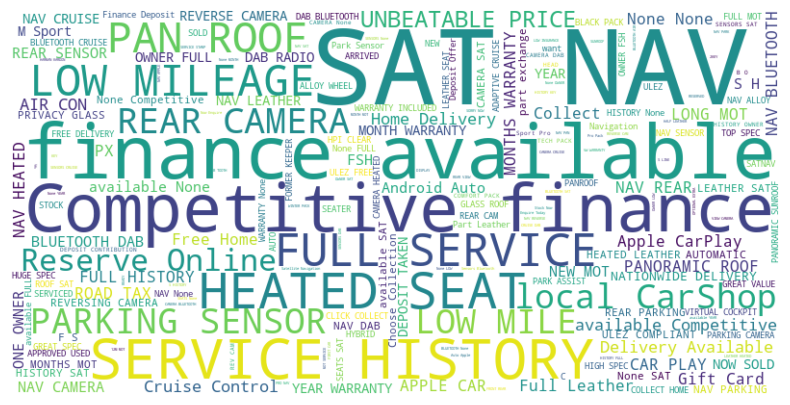

In [35]:
from wordcloud import WordCloud

attention_grabber_text = ' '.join(text_processed_df['attention_grabber'].astype(str))

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(attention_grabber_text)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

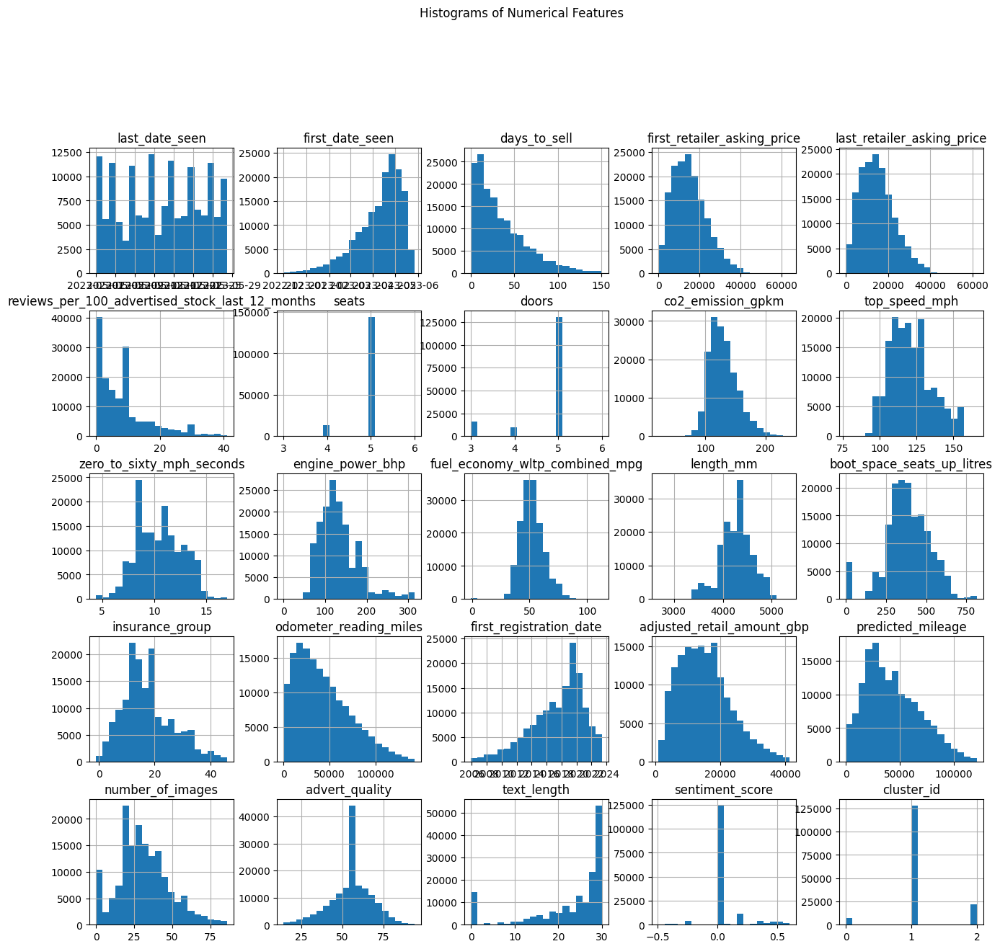

In [36]:
processed_df.hist(figsize=(16, 14), bins=20)
plt.suptitle('Histograms of Numerical Features', y=1.02)
plt.show()

corr_matrix = processed_df[viz_int_columns].corr()

fig = px.imshow(corr_matrix, color_continuous_scale='viridis',
                x=corr_matrix.columns, y=corr_matrix.columns)

fig.update_layout(title='Correlation Matrix for Int Columns', autosize=False, width=800, height=600)
fig.show()

corr_matrix2 = processed_df[processed_df.select_dtypes(include='float').columns.to_numpy()].corr()

fig = px.imshow(corr_matrix2, color_continuous_scale='viridis',
                x=corr_matrix2.columns, y=corr_matrix2.columns)

fig.update_layout(
    title='Correlation Matrix for Float Columns',
    autosize=False,
    width=1000,
    height=1000,
    xaxis=dict(tickangle=-45),
    yaxis=dict(tickangle=-45)
)
fig.show()

SNS pairplot:
- Most of the distributions appear to be right-skewed
- Some of the distributions appear to have outliers still, indicating z score normalisation to not be perfect, but this effect is irrelevant as this temporary df isn't used for later ML.
- Variance in spread among distributions is great. Expectedly, odometer_reading_miles and predicted mileage have great spreaad, whereas insurance group (by definition earlier) and other variables have constrained variation 

In [37]:
# import sweetviz as sv

# eda_report = sv.analyze(df)
# eda_report.show_html('sweetviz_report.html')

In [38]:
# Implementing scatter plot using plotly express, determining relations between retailer asking price and days to sell.
fig = px.scatter(processed_df.sample(n=1000), # As the library is graphical and computationally expensive, only a sample is used. 
                 x='last_retailer_asking_price',
                 y='days_to_sell',
                 color='segment',
                 opacity=0.5,
                 size_max=10, 
                 title='Scatter plot of Days to Sell vs Last Retailer Asking Price',
                 labels={'last_retailer_asking_price': 'Last Retailer Asking Price', 'days_to_sell': 'Days to Sell'},
                 )

fig.update_layout(
    xaxis_title='Last Retailer Asking Price',
    yaxis_title='Days to Sell',
    showlegend=True
)

fig.show()


C:\Users\adiln\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\plotly\express\_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



- lots of variability in the data. Some cars sell quickly regardless of asking price, and others take much longer to sell. This variability could be due to a number of factors, such as:
  - Make and model,
  - Condition of the car,
  - Current market demand for that type of car,
  - Location of the car,
  - etc
- very few visible leasing_vendor values present
- a few visible outliers yet present

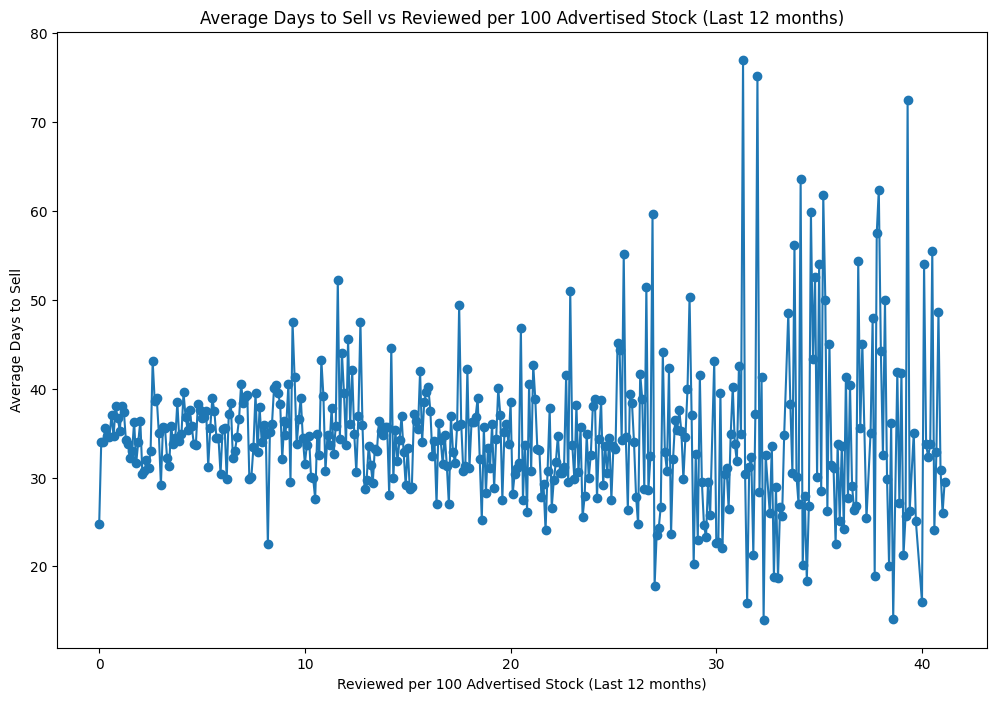

In [39]:
average_days_to_sell = processed_df.groupby('reviews_per_100_advertised_stock_last_12_months')['days_to_sell'].mean()

plt.figure(figsize=(12, 8))
average_days_to_sell.plot(kind='line', marker='o')
plt.title('Average Days to Sell vs Reviewed per 100 Advertised Stock (Last 12 months)')
plt.xlabel('Reviewed per 100 Advertised Stock (Last 12 months)')
plt.ylabel('Average Days to Sell')
plt.show()

- Weak negative correlation between reviews (main central trend is downslope)
- Variation in days to sell increases as there's more reviews, with more positive outliers, indicating much longer days to sell so more reviews tend to get sold slightly faster with greater precision. 

C:\Users\adiln\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\adiln\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



<Figure size 1200x800 with 0 Axes>

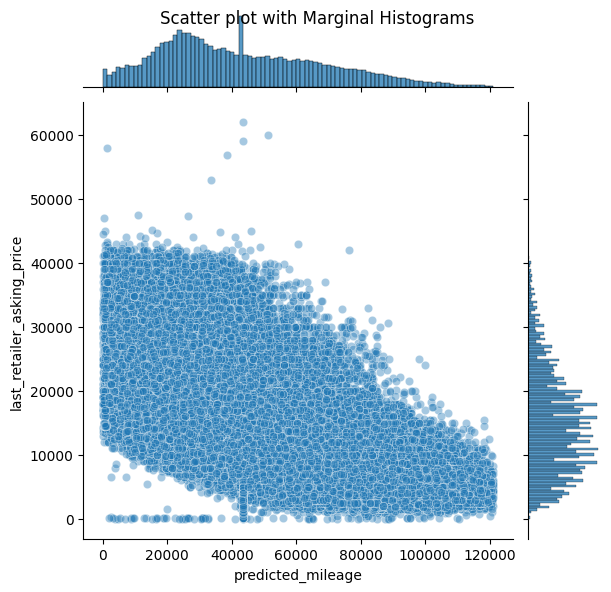

In [40]:
plt.figure(figsize=(12, 8))
sns.jointplot(x='predicted_mileage', y='last_retailer_asking_price', data=processed_df, kind='scatter', alpha=0.4)
plt.suptitle('Scatter plot with Marginal Histograms')
plt.show()

Moderate-to-strong negative correlation, with relatively high variability, indicating those with lower mileage tend to have much higher asking prices, predictably

In [41]:
fig = px.scatter(processed_df.sample(n=1000),
                 x='odometer_reading_miles',
                 y='days_to_sell',
                 color='transmission_type',
                 opacity=0.4,
                 title='Scatter plot of Odometer Reading Miles vs Days to Sell by Transmission Type',
                 labels={'odometer_reading_miles': 'Odometer Reading Miles', 'days_to_sell': 'Days to Sell'},
                 )

fig.update_layout(
    xaxis_title='Odometer Reading Miles',
    yaxis_title='Days to Sell',
    showlegend=True
)

fig.show()

C:\Users\adiln\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\plotly\express\_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



- both types are spread throughout in the distribution, but manual tends to occasionally have higher odometer readings
- automatic has a higher concentration in lower odometer readings, while taking longer to sell as well.
- very minute negative correlation between days to sell and odometer reading. lots of variability

Displaying outlier thresholds, centrality, and overall kernel density distributions.
Ranges too big (5*IQR range being threshold) are displayed logarithmically

C:\Users\adiln\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\adiln\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\adiln\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\adiln\AppData\Local\Packages\PythonSoftwareFoundation.Python.

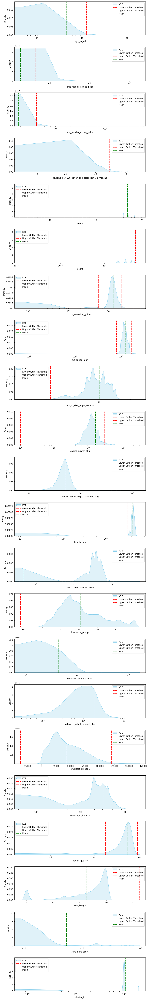

In [42]:
plotting_columns = ['days_to_sell', 'first_retailer_asking_price',
       'last_retailer_asking_price',
       'reviews_per_100_advertised_stock_last_12_months', 
       'co2_emission_gpkm', 'top_speed_mph', 'zero_to_sixty_mph_seconds',
       'engine_power_bhp', 'fuel_economy_wltp_combined_mpg', 'length_mm',
       'boot_space_seats_up_litres', 'insurance_group',
       'odometer_reading_miles', 'adjusted_retail_amount_gbp',
       'predicted_mileage', 'number_of_images', 'advert_quality']

fig, axes = plt.subplots(nrows=len(numeric_columns), ncols=1, figsize=(10, 3 * len(numeric_columns)))

for i, variable in enumerate(numeric_columns):
    Q1 = replaced_df[variable].quantile(0.25)
    Q3 = replaced_df[variable].quantile(0.75)
    IQR = Q3 - Q1
    lower_threshold = Q1 - 1.5 * IQR
    upper_threshold = Q3 + 1.5 * IQR

    if replaced_df[variable].max() - replaced_df[variable].min() > 5 * IQR:
        sns.kdeplot(data=replaced_df, x=variable, ax=axes[i], fill=True, color='skyblue', label='KDE')
        axes[i].set_xscale('log')  
    else:
        sns.kdeplot(data=replaced_df, x=variable, ax=axes[i], fill=True, color='skyblue', label='KDE')

    axes[i].axvline(lower_threshold, color='red', linestyle='--', label='Lower Outlier Threshold')
    axes[i].axvline(upper_threshold, color='red', linestyle='--', label='Upper Outlier Threshold')
    axes[i].axvline(replaced_df[variable].mean(), color='green', linestyle='--', label='Mean')

    axes[i].set_xlabel(variable)
    axes[i].set_ylabel('Density')
    axes[i].legend()

plt.tight_layout()
plt.show()

C:\Users\adiln\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\adiln\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



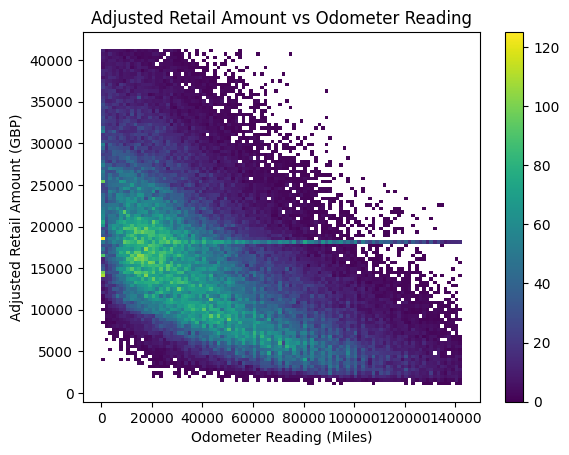

In [43]:

sns.histplot(data=processed_df, x='odometer_reading_miles', y='adjusted_retail_amount_gbp', bins=100, cmap='viridis', cbar=True)

plt.xlabel('Odometer Reading (Miles)')
plt.ylabel('Adjusted Retail Amount (GBP)')
plt.title('Adjusted Retail Amount vs Odometer Reading')

plt.show()


C:\Users\adiln\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\adiln\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



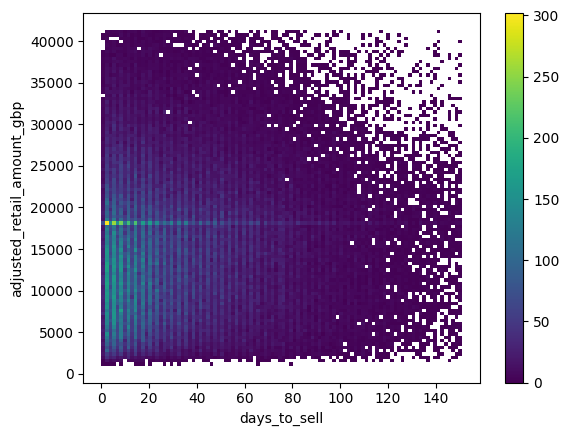

In [44]:
sns.histplot(data=processed_df, x='days_to_sell', y='adjusted_retail_amount_gbp', bins=100, cmap='viridis', cbar=True)
plt.show()

In [45]:
sampled_viz_df = processed_df.sample(n=1000)
fig = ff.create_scatterplotmatrix(sampled_viz_df[key_numeric_variables+['days_to_sell']], diag='histogram', index='days_to_sell', colormap='Viridis', height=1600, width=1600)

fig.update_layout(title='Pair Plot of Numeric Variables', showlegend=False)
fig.show()


Reading in the shapefile and storing in uk_map

In [46]:
processed_df['postcode_area'] = processed_df['postcode_area'].astype(str)

path = r"PostalArea.shp"
uk_map = gpd.read_file(path)

Checking if dataframe postcodes correspond to shapefile postcodes

In [47]:
print("uk_map:")
print(uk_map['PostArea'].unique())

print("\nUnique values in processed_df['postcode_area']:")
print(processed_df['postcode_area'].unique())

uk_map:
['AB' 'AL' 'B' 'BA' 'BB' 'BD' 'BH' 'BL' 'BN' 'BR' 'BS' 'CA' 'CB' 'CF' 'CH'
 'CM' 'CO' 'CR' 'CT' 'CV' 'CW' 'DA' 'DD' 'DE' 'DG' 'DH' 'DL' 'DN' 'DT'
 'DY' 'E' 'EC' 'EH' 'EN' 'EX' 'FK' 'FY' 'G' 'GL' 'GU' 'HA' 'HD' 'HG' 'HP'
 'HR' 'HS' 'HU' 'HX' 'IG' 'IP' 'IV' 'KA' 'KT' 'KW' 'KY' 'L' 'LA' 'LD' 'LE'
 'LL' 'LN' 'LS' 'LU' 'M' 'ME' 'MK' 'ML' 'N' 'NE' 'NG' 'NN' 'NP' 'NR' 'NW'
 'OL' 'OX' 'PA' 'PE' 'PH' 'PL' 'PO' 'PR' 'RG' 'RH' 'RM' 'S' 'SA' 'SE' 'SG'
 'SK' 'SL' 'SM' 'SN' 'SO' 'SP' 'SR' 'SS' 'ST' 'SW' 'SY' 'TA' 'TD' 'TF'
 'TN' 'TQ' 'TR' 'TS' 'TW' 'UB' 'W' 'WA' 'WC' 'WD' 'WF' 'WN' 'WR' 'WS' 'WV'
 'YO' 'ZE']

Unique values in processed_df['postcode_area']:
['BB' 'DE' 'SK' 'CW' 'CV' 'SN' 'TF' 'BT' 'DL' 'WF' 'PO' 'PE' 'NR' 'CA'
 'PR' 'WR' 'OX' 'NG' 'OL' 'NW' 'BS' 'DA' 'SG' 'KY' 'RH' 'DH' 'WA' 'RG'
 'KT' 'CF' 'DY' 'S' 'CT' 'FY' 'TW' 'BR' 'CB' 'CM' 'G' 'EH' 'M' 'SA' 'GU'
 'HP' 'TQ' 'NN' 'HD' 'EN' 'TN' 'AB' 'ML' 'WS' 'SR' 'B' 'ST' 'NP' 'YO' 'SS'
 'WV' 'DT' 'IP' 'BL' 'HA' 'LE' 'ME' 'DN' 'PA' 'L' '

In [48]:
unique_postcode_areas_processed_df = processed_df['postcode_area'].unique()

for unique_value in unique_postcode_areas_processed_df:
    is_present = unique_value in uk_map['PostArea'].unique()
    print(f"{unique_value}: {'Present' if is_present else 'Not Present'} in uk_map")

BB: Present in uk_map
DE: Present in uk_map
SK: Present in uk_map
CW: Present in uk_map
CV: Present in uk_map
SN: Present in uk_map
TF: Present in uk_map
BT: Not Present in uk_map
DL: Present in uk_map
WF: Present in uk_map
PO: Present in uk_map
PE: Present in uk_map
NR: Present in uk_map
CA: Present in uk_map
PR: Present in uk_map
WR: Present in uk_map
OX: Present in uk_map
NG: Present in uk_map
OL: Present in uk_map
NW: Present in uk_map
BS: Present in uk_map
DA: Present in uk_map
SG: Present in uk_map
KY: Present in uk_map
RH: Present in uk_map
DH: Present in uk_map
WA: Present in uk_map
RG: Present in uk_map
KT: Present in uk_map
CF: Present in uk_map
DY: Present in uk_map
S: Present in uk_map
CT: Present in uk_map
FY: Present in uk_map
TW: Present in uk_map
BR: Present in uk_map
CB: Present in uk_map
CM: Present in uk_map
G: Present in uk_map
EH: Present in uk_map
M: Present in uk_map
SA: Present in uk_map
GU: Present in uk_map
HP: Present in uk_map
TQ: Present in uk_map
NN: Prese

Almost all postcodes correspond.

Postcode with the least count: W, Count: 1
Postcode with the most count: S, Count: 37
Rest of the postcodes: 
PostArea
S     37
NW    31
PE    31
NE    24
B     22
      ..
TD     1
FY     1
SP     1
DG     1
N      1
Name: count, Length: 109, dtype: int64
Postcode areas not present in uk_map: ['BT']


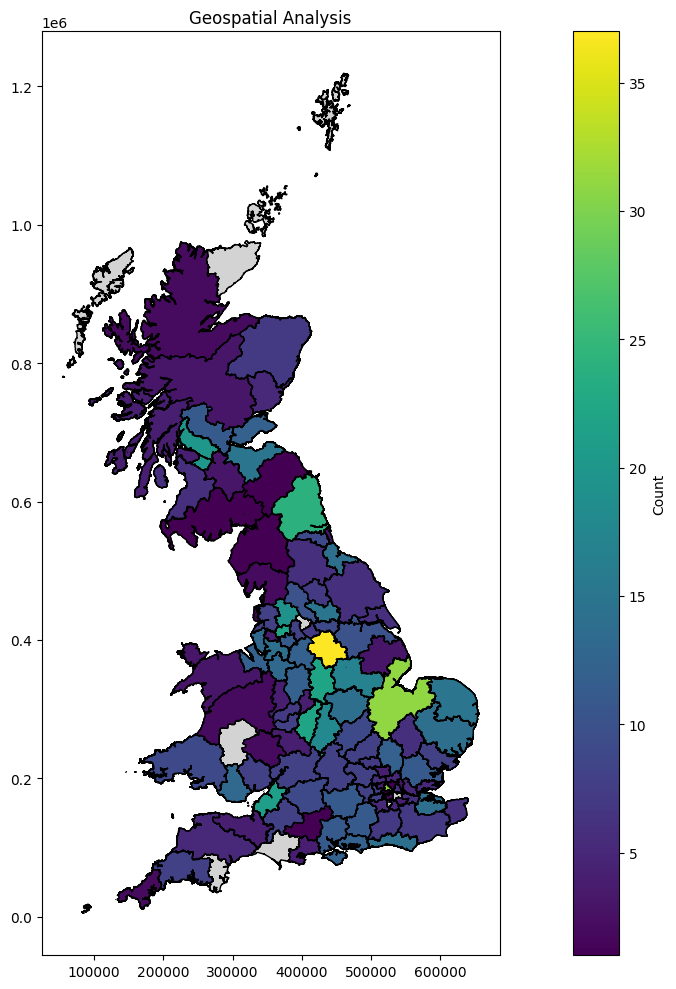

In [49]:
def geospatial_analysis(subset_df, uk_map):
    if 'postcode_area' not in subset_df.columns or 'PostArea' not in uk_map.columns:
        print("Error: Required columns not found in dataframes.")
        return

    missing_postcode_areas = subset_df[~subset_df['postcode_area'].isin(uk_map['PostArea'])]['postcode_area'].unique()

    selected_uk_map = uk_map[uk_map['PostArea'].isin(subset_df['postcode_area'].unique())]

    merged_data_subset = selected_uk_map.merge(subset_df, left_on='PostArea', right_on='postcode_area', how='left')

    counts_by_postcode = merged_data_subset['PostArea'].value_counts()

    merged_data_subset['Count'] = merged_data_subset.groupby('PostArea')['PostArea'].transform('count')

    fig, ax = plt.subplots(figsize=(15, 10))
    uk_map.plot(ax=ax, color='lightgrey', edgecolor='black')
    geo_plot = merged_data_subset.plot(ax=ax, column='Count', cmap='viridis', markersize=50, legend=True, edgecolor='black', legend_kwds={'label': "Count"}, vmin=counts_by_postcode.min(), vmax=counts_by_postcode.max())

    if not counts_by_postcode.empty:
        min_count_postcode = counts_by_postcode.idxmin()
        max_count_postcode = counts_by_postcode.idxmax()

        print(f"Postcode with the least count: {min_count_postcode}, Count: {counts_by_postcode[min_count_postcode]}")
        print(f"Postcode with the most count: {max_count_postcode}, Count: {counts_by_postcode[max_count_postcode]}")
        print(f"Rest of the postcodes: \n{counts_by_postcode}")
    else:
        print("No data to display.")

    print(f"Postcode areas not present in uk_map: {missing_postcode_areas}")

    plt.title('Geospatial Analysis')
    plt.tight_layout()  

    cbar = geo_plot.get_figure().get_axes()[1]
    cbar.set_label("Count")

    plt.show()

subset_of_data = processed_df.sample(1000)  # CAN ALTER AMOUNT SAMPLED HERE. 
# Can use small samples like 5 to verify it correctly parses in data and displays in map
geospatial_analysis(subset_of_data, uk_map)

- Apparently, there is a greater concentration of cars sold in postcodes like: NW, S, G, B, NE.
- Whereas postcodes rarely selling cars are: HX, WD, SM, DG, and others.

In [50]:
print(processed_df.groupby('postcode_area').size().reset_index(name='Count'))

    postcode_area  Count
0              AB   1332
1              AL    786
2               B   4404
3              BA    923
4              BB   1753
..            ...    ...
112            WN    888
113            WR    652
114            WS    970
115            WV   1187
116            YO   1193

[117 rows x 2 columns]


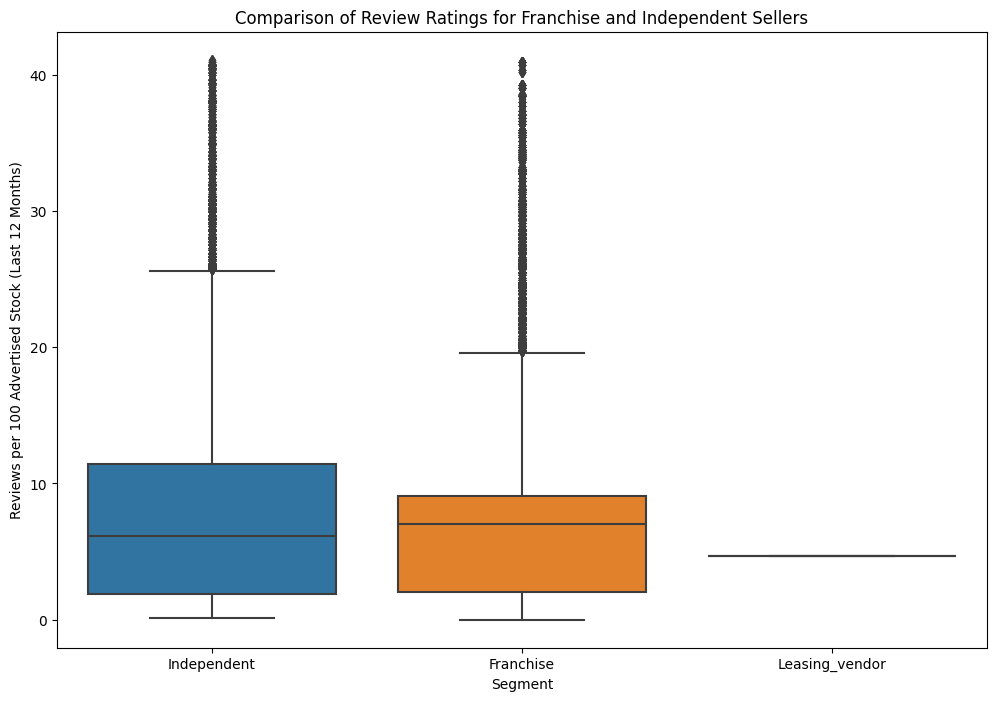

In [51]:
segment_distribution = processed_df['segment'].value_counts()
colors = ['skyblue', 'lightcoral']  

plt.figure(figsize=(12, 8))
sns.boxplot(x='segment', y='reviews_per_100_advertised_stock_last_12_months', data=processed_df)
plt.xlabel('Segment')
plt.ylabel('Reviews per 100 Advertised Stock (Last 12 Months)')
plt.title('Comparison of Review Ratings for Franchise and Independent Sellers')
plt.show()

- Almost no skew in independent cars, albeit higher IQR range
- Negative skew in franchise cars, with greater median compared to independent ones, less variance in contrast as well

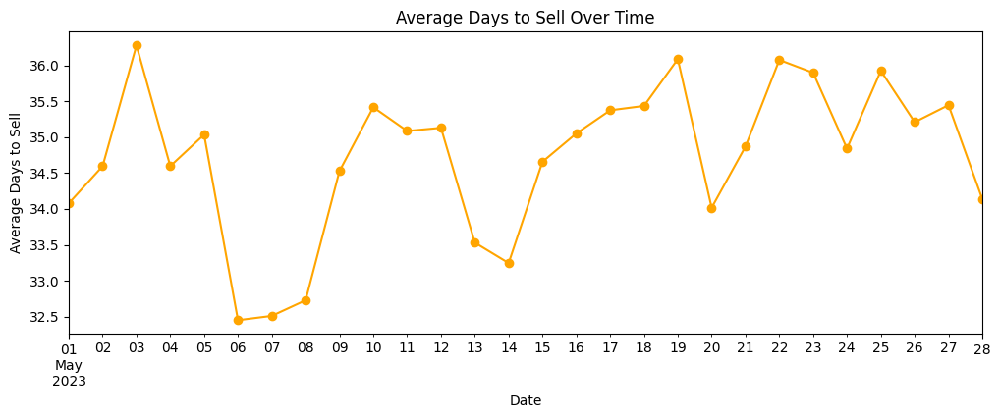

In [52]:
fig = px.violin(processed_df, x='price_indicator_rating', y='days_to_sell', 
                title='Price Indicator Rating',
                labels={'price_indicator_rating': 'Indicator Rating', 'days_to_sell': 'Days to Sell'})

fig.update_layout(
    autosize=False,
    width=800,
    height=500,
)

fig.show()


average_days_to_sell = processed_df.groupby('last_date_seen')['days_to_sell'].mean()
plt.figure(figsize=(12, 4))
average_days_to_sell.plot(marker='o', linestyle='-', color='orange')
plt.xlabel('Date')
plt.ylabel('Average Days to Sell')
plt.title('Average Days to Sell Over Time')
plt.show()


In [53]:
fig = px.violin(processed_df, x='fuel_type', y='odometer_reading_miles', 
                title='Comparison of Odometer Reading Miles Across Fuel Types',
                labels={'fuel_type': 'Fuel Type', 'odometer_reading_miles': 'Odometer Reading Miles'})

fig.update_layout(
    autosize=False,
    width=800,
    height=500,
)

fig.show()

Those with Bi Fuel tend to have much more concentration in lower odometer readings.
Comparitively, Diesel has the more variation.
The others are similar, with central tendencies around 10-25K and high skews. 

In [54]:

downsampled_df = processed_df.sample(1000)
scatter_plot = px.scatter(
    downsampled_df,
    x='odometer_reading_miles',
    y='adjusted_retail_amount_gbp',
    color='price_indicator_rating',
    title='Scatter Plot of Adjusted Retail Amount vs. Odometer Reading',
    labels={'odometer_reading_miles': 'Odometer Reading (Miles)', 'adjusted_retail_amount_gbp': 'Adjusted Retail Amount (GBP)'}
)

histogram_first = go.Figure()
histogram_first.add_trace(go.Histogram(x=downsampled_df['first_retailer_asking_price'], nbinsx=30))
histogram_first.update_layout(title='Histogram of First Retailer Asking Price', xaxis_title='First Retailer Asking Price')

scatter_plot.show()
histogram_first.show()


C:\Users\adiln\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\plotly\express\_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



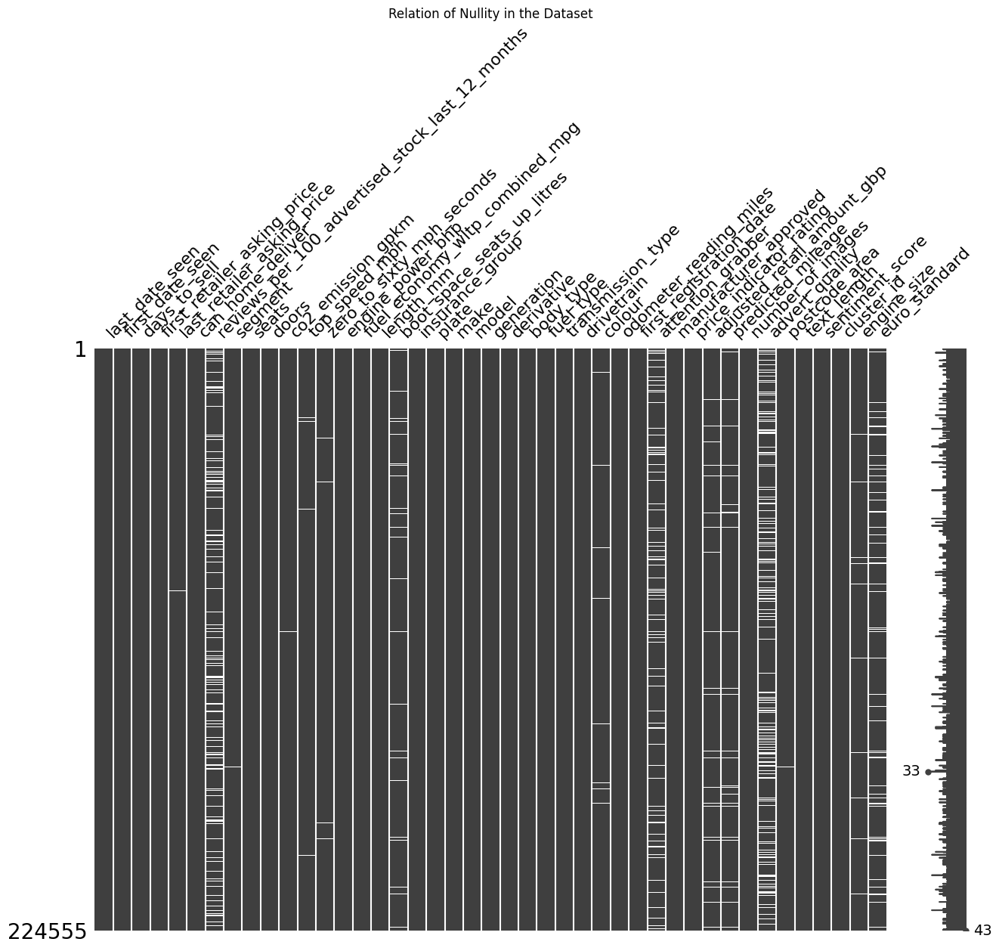

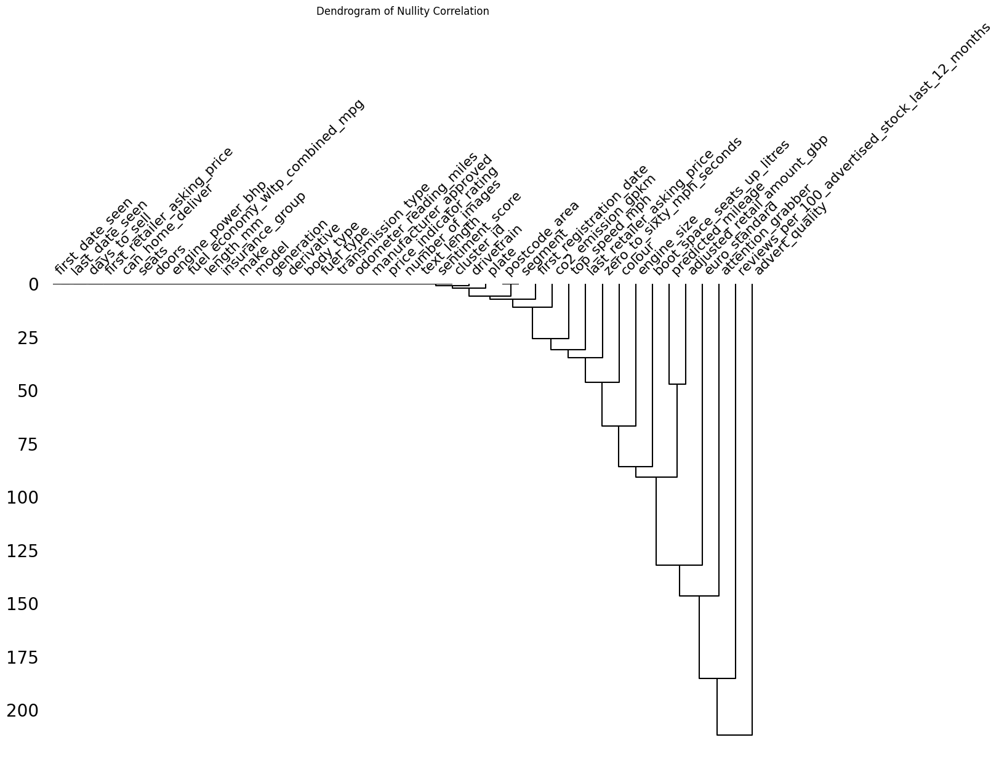

In [55]:
msno.matrix(results_df, figsize=(15, 10))
plt.title('Relation of Nullity in the Dataset')
plt.show()

msno.dendrogram(results_df, figsize=(15, 10))
plt.title('Dendrogram of Nullity Correlation')
plt.show()

# The height indicates the level of correlation between the two attributes in terms of missing data within RESULTS DF

In [56]:
numerical_columns = df.select_dtypes(include=['float64', 'int32', 'Int64']).columns
numerical_df = df[numerical_columns]

numerical_df = numerical_df.dropna()

vif_data = pd.DataFrame()
vif_data["Variable"] = numerical_df.columns
vif_data["VIF"] = [variance_inflation_factor(numerical_df.values, i) for i in range(numerical_df.shape[1])]

vif_data

,Variable,VIF
0,days_to_sell,2.532607
1,first_retailer_asking_price,59.121632
2,last_retailer_asking_price,323.495116
3,reviews_per_100_advertised_stock_last_12_months,1.512548
4,seats,131.202620
5,doors,99.674517
6,co2_emission_gpkm,8.747053
7,top_speed_mph,53.234765
8,battery_range_miles,12.457602
9,boot_space_seats_up_litres,10.651771


- Very high scores for last retailer asking price (59-323) and adjusted retail amount (338). Thus these variables are highly collinear - i.e they carry the same information. May need to remove some during feature selection
- Days to sell, images, odometer, and reviews have low VIF close to 1. Not collinear with other variables. Good to keep as predictors, assuming they have high impact on model predictability
- Variables like seats, doors, etc have moderately high VIF from 50-131 which signifies moderate collinearity, or redundancy


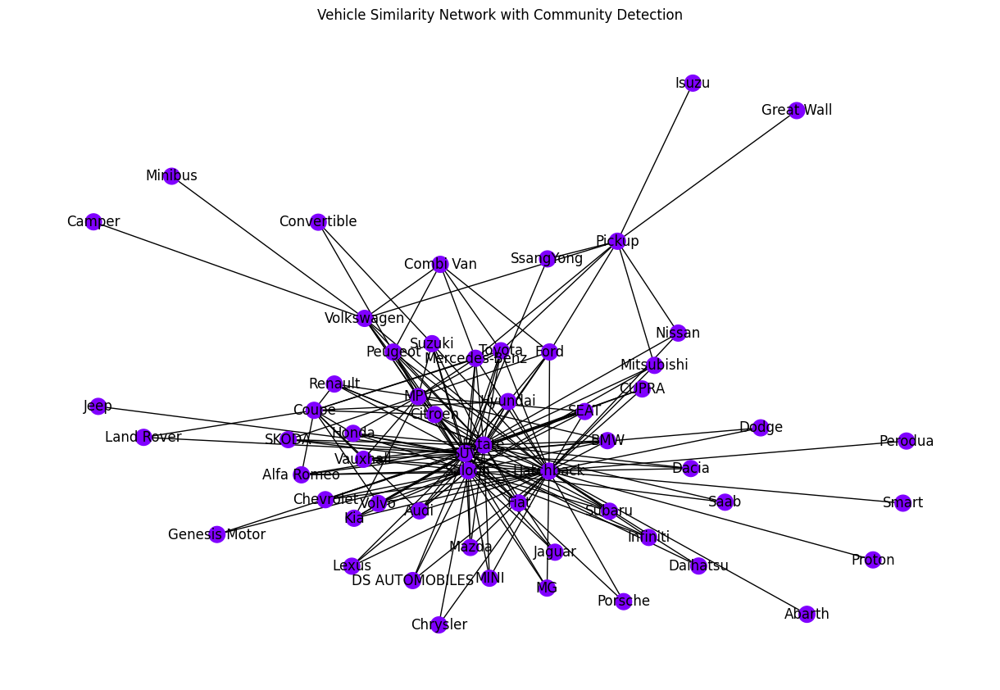

In [57]:
attributes = ['make', 'body_type']

subset_df = processed_df[attributes]

G = nx.from_pandas_edgelist(subset_df, source='make', target='body_type', create_using=nx.Graph())

pos = nx.spring_layout(G)

communities = list(nx.community.label_propagation.label_propagation_communities(G))

node_community_map = {node: i for i, comm in enumerate(communities) for node in comm}

color_map = [node_community_map[node] for node in G.nodes]

plt.figure(figsize=(12, 8))
nx.draw(G, pos, with_labels=True, node_size=200, node_color=color_map, cmap=plt.cm.rainbow)
plt.title('Vehicle Similarity Network with Community Detection')
plt.show()

Network display for similarities within vehicles. This can be used in relation to days to sell to identify common patterns among car types and their relations with days to sell 

In [58]:
processed_df.select_dtypes(include=['object', 'category']).columns.tolist()

['segment',
 'plate',
 'make',
 'model',
 'generation',
 'derivative',
 'body_type',
 'fuel_type',
 'transmission_type',
 'drivetrain',
 'colour',
 'attention_grabber',
 'price_indicator_rating',
 'postcode_area',
 'engine_size',
 'euro_standard']

In [59]:

def count_plot_categorical(df, categorical_columns):
    for column in categorical_columns:
        fig = px.histogram(df, x=column, color_discrete_sequence=['#636EFA'], title=f'Count Plot for {column}')
        fig.update_layout(xaxis_title=column, yaxis_title='Count')
        fig.show()

def bar_plot_categorical(df, categorical_columns, target_column):
    for column in categorical_columns:
        fig = px.bar(df, x=column, y=target_column, color_discrete_sequence=['#636EFA'], title=f'Bar Plot for {column} vs {target_column}')
        fig.update_layout(xaxis_title=column, yaxis_title=target_column)
        fig.show()

def pie_chart_categorical(df, categorical_columns, threshold):
    for column in categorical_columns:
        value_counts_percent = df[column].value_counts(normalize=True) * 100
        
        main_categories = value_counts_percent[value_counts_percent >= threshold]
        other_categories = value_counts_percent[value_counts_percent < threshold]
        
        if other_categories.sum() < threshold:
            main_categories = main_categories.append(other_categories)
            other_slice = pd.Series({'Other': 0})
        else:
            other_slice = pd.Series({'Other': other_categories.sum()})
        
        grouped_value_counts = main_categories.append(other_slice).reset_index(name='value')
        
        fig = px.pie(grouped_value_counts, values='value', names='index', title=f'Pie Chart for {column} (Grouping Below {threshold}%)')
        fig.update_traces(textinfo='percent+label', pull=[0.1] * len(grouped_value_counts))  
        fig.show()

target_column = 'days_to_sell' 

cols = processed_df.select_dtypes(include=['object', 'category']).columns.tolist()

Note: These visualizations require a lot of computational power. Please uncomment if appropriate 

In [60]:
# count_plot_categorical(df, [column for column in df.columns if df[column].nunique() < 15 and df[column].dtype in ['object', 'category']])

In [61]:
# bar_plot_categorical(df, [column for column in df.columns if df[column].nunique() < 15 and df[column].dtype in ['object', 'category']], target_column)

In [62]:
# pie_chart_categorical(processed_df, cols, 10)

____________________
# <span style="color:skyblue; font-weight:bold;">Data Preprocessing: Further Feature Engineering, Encoding, Imputing, Transforming, and Scaling.</span>

In [63]:
# Attention grabber no longer needed as all necessary information extracted.
temp_df = results_df.drop(columns=['attention_grabber'], axis=1)
print("After dropping 'attention_grabber':", temp_df.shape)

temp_df2 = temp_df.copy()

categorical_columns = temp_df2.select_dtypes(include=['object']).columns
binary_columns = temp_df2.select_dtypes(include=['bool']).columns

categorical_columns = [col for col in categorical_columns if col not in binary_columns]

catboost_encoder = CatBoostEncoder(cols=categorical_columns)

# Encoding categorical variables in relation to days_to_sell
encoded_df = catboost_encoder.fit_transform(temp_df2, temp_df2['days_to_sell'])
encoded_df[binary_columns] = encoded_df[binary_columns].astype(int) # Converting bool columns to binary

print(encoded_df.head())

After dropping 'attention_grabber': (224555, 42)


  last_date_seen first_date_seen  days_to_sell  first_retailer_asking_price  last_retailer_asking_price  can_home_deliver  reviews_per_100_advertised_stock_last_12_months     segment  seats  doors  co2_emission_gpkm  top_speed_mph  zero_to_sixty_mph_seconds  engine_power_bhp  fuel_economy_wltp_combined_mpg  length_mm  boot_space_seats_up_litres  insurance_group      plate        make      model  generation  derivative   body_type   fuel_type  transmission_type  drivetrain     colour  odometer_reading_miles first_registration_date  manufacturer_approved  price_indicator_rating  adjusted_retail_amount_gbp  predicted_mileage  number_of_images  advert_quality  postcode_area  text_length  sentiment_score  cluster_id  engine_size  euro_standard
0     2023-05-05      2021-03-25           771                         6995                      6495.0                 0                                              3.9   44.423771    5.0    3.0              194.0          137.0                     

In [64]:
# encoded_df[['first_date_seen', 'last_date_seen']].dt.total_seconds().astype(float)

In [65]:
temp_df = encoded_df.copy()
categorical_columns = encoded_df.select_dtypes(include=['category']).columns
temp_df[categorical_columns] = encoded_df[categorical_columns].astype(str)

numeric_columns = encoded_df.select_dtypes(include=np.number).columns
encoded_df[numeric_columns] = encoded_df[numeric_columns].replace(-1, np.nan) # Replacing previous -1 values back to Nan

for column in ['first_registration_date', 'first_date_seen', 'last_date_seen']: 
    temp_df[column] = encoded_df[column].apply(lambda x: pd.Timestamp(x).timestamp() if not pd.isnull(x) else x) # Converting to timestamp to allow imputation
    temp_df[column] = pd.to_numeric(encoded_df[column], errors='coerce') # Then converting to numeric


# temp_df[['first_date_seen', 'last_date_seen']] = encoded_df[['first_date_seen', 'last_date_seen']].astype(float)
# temp_df[['first_date_seen', 'last_date_seen']] = encoded_df[['first_date_seen', 'last_date_seen']].dt.total_seconds().astype(float)

temp_df = temp_df.astype(float)


imputer = IterativeImputer(max_iter=10, random_state=0) # Imputing null values with iterative imputer
imputed_df = pd.DataFrame(imputer.fit_transform(temp_df), columns=encoded_df.columns)


imputed_df

,last_date_seen,first_date_seen,days_to_sell,first_retailer_asking_price,last_retailer_asking_price,can_home_deliver,reviews_per_100_advertised_stock_last_12_months,segment,seats,doors,co2_emission_gpkm,top_speed_mph,zero_to_sixty_mph_seconds,engine_power_bhp,fuel_economy_wltp_combined_mpg,length_mm,boot_space_seats_up_litres,insurance_group,plate,make,model,generation,derivative,body_type,fuel_type,transmission_type,drivetrain,colour,odometer_reading_miles,first_registration_date,manufacturer_approved,price_indicator_rating,adjusted_retail_amount_gbp,predicted_mileage,number_of_images,advert_quality,postcode_area,text_length,sentiment_score,cluster_id,engine_size,euro_standard
0,1.683245e+18,1.616630e+18,771.0,6995.0,6495.0,0.0,3.90000,44.423771,5.0,3.0,194.0,137.0,7.2,172.0,22.1,3803.0,-20240.266375,31.0,44.423771,44.423771,44.423771,44.423771,44.423771,44.423771,44.423771,44.423771,44.423771,44.423771,65000.0,1.083888e+18,0.0,44.423771,-1.094796e+08,1.797000e+08,50.0,2122.435446,44.423771,26.0,0.0000,1.0,44.423771,44.423771
1,1.683590e+18,1.621901e+18,714.0,13725.0,14995.0,0.0,198.16806,44.423771,5.0,5.0,108.0,113.0,13.3,99.0,50.4,4065.0,311.000000,10.0,44.423771,44.423771,44.423771,44.423771,44.423771,407.711886,407.711886,407.711886,407.711886,44.423771,16018.0,1.575072e+18,1.0,44.423771,1.484800e+04,2.607800e+04,15.0,57.000000,44.423771,30.0,0.6249,1.0,44.423771,44.423771
2,1.683850e+18,1.637885e+18,532.0,15499.0,13999.0,0.0,0.20000,407.711886,5.0,5.0,144.0,112.0,12.4,110.0,44.8,4314.0,448.000000,10.0,44.423771,44.423771,44.423771,44.423771,44.423771,44.423771,509.807924,44.423771,509.807924,44.423771,31093.0,1.520467e+18,0.0,44.423771,1.457100e+04,3.473200e+04,22.0,61.000000,44.423771,27.0,0.0000,2.0,379.211886,379.211886
3,1.684195e+18,1.645056e+18,453.0,10995.0,9995.0,0.0,7.90000,379.211886,5.0,5.0,122.0,121.0,10.0,148.0,60.1,4524.0,406.000000,23.0,44.423771,379.211886,44.423771,44.423771,44.423771,288.211886,44.423771,509.807924,515.355943,44.423771,79000.0,1.435795e+18,0.0,44.423771,9.349000e+03,6.568400e+04,30.0,61.000000,44.423771,27.0,0.0000,1.0,407.711886,430.141257
4,1.683158e+18,1.647821e+18,409.0,46000.0,37500.0,0.0,6.80000,403.807924,5.0,4.0,149.0,152.0,7.9,201.0,49.6,4939.0,530.000000,33.0,44.423771,44.423771,44.423771,44.423771,44.423771,44.423771,248.711886,288.211886,502.884754,44.423771,10214.0,1.646266e+18,1.0,379.211886,3.705500e+04,1.176500e+04,22.0,48.000000,44.423771,14.0,0.0000,1.0,422.807924,435.855943
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
224550,1.685059e+18,1.684886e+18,2.0,11045.0,11045.0,1.0,17.30000,47.751514,5.0,5.0,123.0,130.0,8.5,134.0,53.3,4329.0,360.000000,18.0,37.978125,50.162648,43.540983,42.571975,38.897923,42.757471,42.770045,41.341862,53.213943,44.528472,59000.0,1.457827e+18,0.0,36.958784,1.123000e+04,5.219600e+04,9.0,63.000000,42.373567,28.0,-0.2732,1.0,42.573199,43.757564
224551,1.685232e+18,1.684886e+18,4.0,9000.0,9000.0,0.0,8.30000,41.174738,5.0,5.0,142.0,101.0,13.8,86.0,45.6,3665.0,252.000000,4.0,42.897383,41.214449,41.949210,39.190045,43.903962,42.757042,42.769716,47.833008,42.179040,44.527565,37717.0,1.416874e+18,0.0,36.958406,8.898000e+03,4.970300e+04,19.0,31.000000,34.228292,30.0,0.1779,1.0,40.288775,42.483415
224552,1.685146e+18,1.684973e+18,2.0,11300.0,11300.0,0.0,1.70000,41.174410,5.0,5.0,107.0,121.0,13.3,118.0,57.6,4040.0,311.000000,14.0,47.728631,38.186439,37.054095,38.313576,38.840704,42.756634,43.581540,41.341529,42.178801,46.857491,51488.0,1.575072e+18,0.0,48.225524,1.164600e+04,2.813400e+04,4.0,30.000000,42.795417,9.0,0.6249,1.0,42.571766,43.757303
224553,1.685146e+18,1.684973e+18,2.0,4699.0,4699.0,0.0,8.70000,47.751101,4.0,2.0,150.0,118.0,10.7,120.0,43.5,4037.0,187.000000,17.0,48.004416,43.104609,62.328996,67.460649,63.552971,60.582943,42.769402,41.341195,42.178551,43.492795,38408.0,1.315872e+18,0.0,36.958051,4.743000e+03,5.324900e

In [66]:
from sklearn.preprocessing import RobustScaler
from sklearn.ensemble import IsolationForest

columns_to_scale = ['days_to_sell','reviews_per_100_advertised_stock_last_12_months','segment','co2_emission_gpkm',
                    'top_speed_mph','engine_power_bhp','fuel_economy_wltp_combined_mpg',
                    'length_mm', 'boot_space_seats_up_litres', 'insurance_group', 'plate', 'make', 'model',
                    'generation', 'derivative', 'body_type', 'fuel_type', 'transmission_type', 'drivetrain',
                    'colour', 'odometer_reading_miles', 'first_registration_date',
                    'price_indicator_rating', 'adjusted_retail_amount_gbp', 'predicted_mileage',
                    'number_of_images', 'advert_quality', 'postcode_area', 'text_length', 'last_date_seen', 'first_date_seen',
                    'first_retailer_asking_price', 'last_retailer_asking_price', 'engine_size','euro_standard']
scaled_df = imputed_df.copy()

scaled_df[columns_to_scale] = RobustScaler().fit_transform(scaled_df[columns_to_scale])

# Isolation Forest used here to handle outliers specifically
outlier_detector = IsolationForest(contamination=0.05)  # CAN ADJUST CONTAMINATION RATE
scaled_df['outlier_flag'] = outlier_detector.fit_predict(scaled_df[columns_to_scale])

# Filtering out outliers based on the flag
scaled_df = scaled_df[scaled_df['outlier_flag'] == 1].drop(columns=['outlier_flag'])
scaled_df

,last_date_seen,first_date_seen,days_to_sell,first_retailer_asking_price,last_retailer_asking_price,can_home_deliver,reviews_per_100_advertised_stock_last_12_months,segment,seats,doors,co2_emission_gpkm,top_speed_mph,zero_to_sixty_mph_seconds,engine_power_bhp,fuel_economy_wltp_combined_mpg,length_mm,boot_space_seats_up_litres,insurance_group,plate,make,model,generation,derivative,body_type,fuel_type,transmission_type,drivetrain,colour,odometer_reading_miles,first_registration_date,manufacturer_approved,price_indicator_rating,adjusted_retail_amount_gbp,predicted_mileage,number_of_images,advert_quality,postcode_area,text_length,sentiment_score,cluster_id,engine_size,euro_standard
775,-0.571429,0.311111,-0.454545,-0.303680,-0.299326,0.0,-0.365385,1.592655,5.0,5.0,0.289474,-0.136364,9.3,0.194444,0.240260,0.125234,0.479381,0.0625,-0.390907,1.890362,0.237789,-0.579203,0.184908,10.181695,11.256514,2.300530,3.056035,2.651393,0.862077,-0.478471,0.0,1.490129,-0.281631,0.587875,-0.363636,0.12,-1.720229,-0.111111,0.0000,1.0,3.873527,23.969534
785,-0.642857,0.311111,-0.477273,-0.947053,-0.973783,0.0,0.115385,2.258259,7.0,5.0,0.710526,-0.454545,13.2,-0.430556,-0.110390,0.059813,1.639175,-0.3750,0.005625,1.554330,-0.927215,0.113061,0.184908,10.488933,10.688337,2.218671,2.586396,8.285275,2.330662,-1.865447,0.0,3.754671,-0.933073,2.048839,1.454545,0.04,1.455614,0.444444,0.0000,1.0,0.218669,1.051622
802,-0.642857,0.377778,-0.545455,-0.304323,-0.300000,0.0,-0.282051,2.139715,5.0,5.0,0.473684,0.409091,8.5,0.652778,0.051948,0.540187,-1.943299,0.6250,0.635992,0.768609,-0.523996,0.113061,0.184908,9.375952,9.569077,2.443995,2.863880,2.142421,0.803099,-1.081270,0.0,3.697315,-0.249880,1.246064,-1.090909,-0.72,-0.481325,0.444444,0.0000,2.0,3.498398,9.038978
804,0.357143,0.377778,-0.227273,-0.575205,-0.583970,0.0,-0.256410,2.097877,5.0,5.0,-0.289474,0.500000,8.5,0.097222,0.948052,-0.065421,-0.087629,0.1250,2.784956,0.685068,-1.283458,-0.945192,-0.449332,10.048470,9.166918,2.085167,1.690877,3.038533,0.736684,-1.254037,0.0,0.542713,-0.588456,1.547687,-0.136364,0.76,-2.030743,0.111111,0.0000,0.0,3.432632,7.944246
805,-0.142857,0.377778,-0.386364,-0.342908,-0.374157,0.0,-17.145152,2.082387,5.0,4.0,-0.236842,0.909091,7.5,0.472222,0.766234,0.971963,0.840206,1.0000,1.047517,0.445449,-0.518683,-0.904052,0.184908,12.345251,9.026438,2.422489,1.636866,7.422426,1.175581,-0.782024,0.0,0.535012,-0.392353,1.223213,0.681818,-0.28,-2.518060,-0.444444,0.0000,2.0,1.153106,7.577573
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
224550,0.785714,0.866667,-0.590909,-0.300393,-0.295880,1.0,0.737179,0.364058,5.0,5.0,-0.157895,0.409091,8.5,0.000000,0.240260,-0.056075,-0.087629,0.0000,-0.907095,0.891486,0.071326,-0.089846,-0.179565,-0.131358,-0.813990,-0.110812,1.841188,0.017327,0.471021,-0.400431,0.0,-0.154180,-0.284504,0.305966,-1.000000,0.28,-0.312371,0.222222,-0.2732,1.0,0.006727,-0.142815
224551,0.928571,0.866667,-0.545455,-0.446517,-0.449064,0.0,0.160256,-0.639422,5.0,5.0,0.342105,-0.909091,13.8,-0.666667,-0.259740,-1.297196,-0.644330,-0.8750,-0.174386,-0.476392,-0.075449,-0.460414,0.150623,-0.131670,-0.814358,0.895576,-0.050788,0.017029,-0.000155,-0.655544,0.0,-0.154215,-0.456297,0.245810,-0.545455,-1.00,-1.528947,0.444444,0.1779,1.0,-0.530406,-2.427226
224552,0.857143,0.888889,-0.590909,-0.282172,-0.276779,0.0,-0.262821,-0.639472,5.0,5.0,-0.578947,0.000000,13.3,-0.222222,0.519481,-0.596262,-0.340206,-0.2500,0.545214,-0.939273,-0.526823,-0.556452,-0.183339,-0.131967,0.092429,-0.110863,-0.050829,0.780420,0.304716,0.329925,0.0,0.877903,-0.253858,-0.274646,-1.227273,-1.04,-0.249364,-1.888889,0.6249,1.0,0.006390,-0.143283
224553,0.857143,0.888889,-0.590909,-0.753841,-0.771236,0.0,0.185897,0.363995,4.0,2.0,0.552632,-0.136364,10.7,-0.194444,-0.396104,-0.601869,-0.979381,-0.0625,0.586291,-0.187450,1.803752,2.637281,1.446629,12.830773,-0.814709,-0.110915,-0.0

In [67]:
print("Rows lost after scaling and transforming: ", imputed_df.shape[0] - scaled_df.shape[0])

Rows lost after scaling and transforming:  11228


Size of lost values is negligable in contrast to overall dataset size

Feature Selection using SelectKBest, perfect for our situation because:
- We have a mix of numeric and categorical features
- Handles correlations between features like make, model etc.
- Gives an importance measure
- Non-parametric and model agnostic, works directly on the data
- Captures feature interactions and non-linear relationships
- Robust to correlated features

<span style="color:red; font-weight:bold;">IMPORTANT:</span>

As 'days_to_sell' is equivalent to the range between last_seen and first_seen, and it is the target variable, last_seen must also be dropped. Else predicting 'days_to_sell' would effectively be as simple as getting the difference between the variables, and it is not an accurate simulation of the real world instances where last_seen is not known

In [68]:
from sklearn.feature_selection import SelectKBest, f_regression

X = scaled_df.drop(columns=['days_to_sell', 'last_date_seen'], axis=1)
y = scaled_df['days_to_sell']

selector = SelectKBest(score_func=f_regression, k=22)
selector.fit(X, y)
selected_features = X.columns[selector.get_support()]

feature_scores = sorted(zip(X.columns, selector.scores_), key=lambda x: x[1], reverse=True)
total_score = sum(score for _, score in feature_scores)
print("Percentage Scoring for all features: ")
for feature, score in feature_scores:
    percentage = (score / total_score) * 100
    print(f'{feature}: {percentage:}%')
X_selected_df = X[selected_features]


Percentage Scoring for all features: 
first_date_seen: 99.68855299649883%
price_indicator_rating: 0.07221971051957835%
number_of_images: 0.02803599919400574%
model: 0.023058485320531657%
first_retailer_asking_price: 0.02004042272016612%
plate: 0.01902199817197671%
generation: 0.01569280727649884%
derivative: 0.01464973094988662%
postcode_area: 0.013387321401086663%
fuel_type: 0.013058039287061238%
make: 0.011059994733373713%
insurance_group: 0.008766981926485605%
engine_size: 0.00816466947157541%
text_length: 0.007382476988231783%
segment: 0.007328653383151497%
odometer_reading_miles: 0.006579461032587335%
engine_power_bhp: 0.006539940709571958%
transmission_type: 0.005806188508809489%
first_registration_date: 0.005325824082468741%
body_type: 0.004191829507795159%
advert_quality: 0.003333240966597703%
drivetrain: 0.0029401239286926703%
colour: 0.0027675506286563133%
co2_emission_gpkm: 0.0025267503828091953%
doors: 0.0016454801642437123%
length_mm: 0.0012618966182968102%
manufacturer_ap

____________________
First_date_seen dominates with a very high score of 99.77%. This indicates this feature almost completely drives the model itself. Makes other features negligible. Price_indicator_rating is the next highest at 0.05%. Still very small but non-trivial compared to other features. Most other features- make, model, images, etc score < 0.02%, essentially no impact. This raises overfitting concerns since the model relies almost exclusively on just one temporal variable. Albeit this bias is moderated by the proceeding cross validation

* first_date_seen: Cars listed early may take longer to sell (less popular models, high prices)
* price_indicator_rating: Perceived price vs. value strongly affects selling time
* model: Car model itself is key as some are simply in higher demand
* number_of_images: More images may boost interest, leading to faster sales

Notes: 
* Importance is relative to the model, not absolute
* Unmeasured factors (condition, market trends) also matter 

In [69]:
print("\nSelected Features:")
print(selected_features)

print(f'\n{X.shape[1]-X_selected_df.shape[1]} dropped columns')


Selected Features:
Index(['first_date_seen', 'first_retailer_asking_price', 'segment',
       'engine_power_bhp', 'insurance_group', 'plate', 'make', 'model',
       'generation', 'derivative', 'body_type', 'fuel_type',
       'transmission_type', 'drivetrain', 'odometer_reading_miles',
       'first_registration_date', 'price_indicator_rating', 'number_of_images',
       'advert_quality', 'postcode_area', 'text_length', 'engine_size'],
      dtype='object')

18 dropped columns


In [70]:
from sklearn.ensemble import GradientBoostingRegressor, StackingRegressor
from sklearn.model_selection import cross_validate
from xgboost import XGBRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.linear_model import LinearRegression

In [71]:
gb_regressor = GradientBoostingRegressor(random_state=1, n_estimators=30)
xgb_regressor = XGBRegressor(random_state=1, n_estimators=30)
neural_network_regressor = MLPRegressor(hidden_layer_sizes=(100,), max_iter=100)

ensemble_regressor = StackingRegressor(estimators=[
                                                   ('Gradient Boosting', gb_regressor), 
                                                   ('XGBoost', xgb_regressor),
                                                   ('Neural Network', neural_network_regressor)
                                                   ]
                                                   , final_estimator=LinearRegression())
scoring_metrics = ['neg_mean_absolute_error', 'neg_mean_squared_error', 'r2']

cv_results = cross_validate(ensemble_regressor, X_selected_df, y, scoring=scoring_metrics, cv=3)

mae_mean = -cv_results['test_neg_mean_absolute_error'].mean()
mse_mean = -cv_results['test_neg_mean_squared_error'].mean()
r2_mean = cv_results['test_r2'].mean()

print(f'Mean MAE Score: {mae_mean}')
print(f'Mean MSE Score: {mse_mean}')
print(f'Mean R^2 Score: {r2_mean}')

Mean MAE Score: 0.13913118753362427
Mean MSE Score: 0.028446809234406206
Mean R^2 Score: 0.9743691245514667


Fitting the model explicitly to use explainer

In [72]:
ensemble_regressor.fit(X_selected_df, y)

StackingRegressor(estimators=[('Gradient Boosting',
                               GradientBoostingRegressor(n_estimators=30,
                                                         random_state=1)),
                              ('XGBoost',
                               XGBRegressor(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None, device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None, gamma=...
                                            learning_rate=None, max_bin=None,
                                            max_cat_threshold=None,
                                            max_cat_to_onehot=None,
                                            max_delta_step=None, max_depth=None,
                                            max_leaves=None,
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                                            multi_strategy=None,
                                            n_estimators=30, n_jobs=None,
                                            num_parallel_tree=None,
                                            random_state=1, ...)),
                              ('Neural Network', MLPRegressor(max_iter=100))],
                  final_estimator=LinearRegression())

Single instance analysis for explaining model prediction

In [73]:
from lime.lime_tabular import LimeTabularExplainer

sample_idx = 0

explainer = LimeTabularExplainer(X_selected_df.values, feature_names=X_selected_df.columns, mode='regression')
exp = explainer.explain_instance(X_selected_df.iloc[1].values, ensemble_regressor.predict, num_features=X_selected_df.shape[1])
exp.show_in_notebook()

C:\Users\adiln\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\base.py:493: UserWarning:

X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names

C:\Users\adiln\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\base.py:493: UserWarning:

X does not have valid feature names, but MLPRegressor was fitted with feature names



As expected, first_date_seen has a very strong negative effect on the prediction, with a very high impact on the model predictability, covering most of the predictions. The second factor to affect prediction being fuel_type might indirectly affect selling time through buyer preferences and market trends.

____________________
# <span style="color:skyblue; font-weight:bold;">Hyperparameter Tuning</span>

Bayesian Optimization considers model performance using past evaluations to guide search, making it more efficient than random search or grid searches.
Adapts the exploration exploitation trade-off to find the best hyperparameters, with fewer evaluations compared to traditional methods.

In [74]:
from bayes_opt import BayesianOptimization
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error

def optimize(learning_rate_gb, n_estimators_gb, max_depth_gb, learning_rate_xgb, n_estimators_xgb, max_depth_xgb, hidden_layer_sizes_nn, max_iter_nn):
    gb_regressor = GradientBoostingRegressor(learning_rate=learning_rate_gb, n_estimators=int(n_estimators_gb), max_depth=int(max_depth_gb))
    xgb_regressor = XGBRegressor(learning_rate=learning_rate_xgb, n_estimators=int(n_estimators_xgb), max_depth=int(max_depth_xgb))
    nn_regressor = MLPRegressor(hidden_layer_sizes=(int(hidden_layer_sizes_nn),), max_iter=int(max_iter_nn))

    ensemble_regressor = StackingRegressor(estimators=[
        ('Gradient Boosting', gb_regressor),
        ('XGBoost', xgb_regressor),
        ('Neural Network', nn_regressor)
    ], final_estimator=LinearRegression())

    X_train, X_test, y_train, y_test = train_test_split(X_selected_df.sample(frac =0.5), y.sample(frac =0.5), test_size=0.2)

    ensemble_regressor.fit(X_train, y_train)

    y_pred = ensemble_regressor.predict(X_test)
    mae_score = -mean_absolute_error(y_test, y_pred)

    return mae_score

pbounds = {
    'learning_rate_gb': (0.01, 0.2),
    'n_estimators_gb': (50, 200),
    'max_depth_gb': (3, 10),
    'learning_rate_xgb': (0.01, 0.2),
    'n_estimators_xgb': (50, 200),
    'max_depth_xgb': (3, 10),
    'hidden_layer_sizes_nn': (50, 200),
    'max_iter_nn': (50, 200)
}

optimizer = BayesianOptimization(
    f=optimize,
    pbounds=pbounds,
)
optimizing = False
if optimizing:
    optimizer.maximize(init_points=5, n_iter=3)

    best_params = optimizer.max['params']
    print(f'Best Hyperparameters: {best_params}')

In [75]:
if optimizing:
    best_gb_regressor = GradientBoostingRegressor(learning_rate=best_params['learning_rate_gb'], 
                                                n_estimators=int(best_params['n_estimators_gb']), 
                                                max_depth=int(best_params['max_depth_gb']))

    best_xgb_regressor = XGBRegressor(learning_rate=best_params['learning_rate_xgb'], 
                                    n_estimators=int(best_params['n_estimators_xgb']), 
                                    max_depth=int(best_params['max_depth_xgb']))

    best_nn_regressor = MLPRegressor(hidden_layer_sizes=(int(best_params['hidden_layer_sizes_nn']),), 
                                    max_iter=int(best_params['max_iter_nn']))

    best_ensemble_regressor = StackingRegressor(estimators=[
        ('Gradient Boosting', best_gb_regressor),
        ('XGBoost', best_xgb_regressor),
        ('Neural Network', best_nn_regressor)
    ], final_estimator=LinearRegression())

    X_train, X_test, y_train, y_test = train_test_split(X_selected_df, y, test_size=0.2) # Sampling here to save time.

    best_ensemble_regressor.fit(X_train, y_train)

    y_pred = best_ensemble_regressor.predict(X_test)
    final_mae_score = mean_absolute_error(y_test, y_pred)

    print(f'Final Model Mean Absolute Error: {final_mae_score}')

In [83]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, explained_variance_score
from sklearn.model_selection import cross_val_predict, KFold


def regression_metrics(y_true, y_pred):
    mae, mse, r2, explained_var = mean_absolute_error(y_true, y_pred), mean_squared_error(y_true, y_pred), r2_score(y_true, y_pred), explained_variance_score(y_true, y_pred)
    return mae, mse, r2, explained_var

def plot_actual_vs_predicted(y_true, y_pred):
    plt.figure(figsize=(10, 6))
    sns.regplot(x=y_true, y=y_pred, scatter_kws={'s': 10, 'alpha': 0.3}, line_kws={'color': 'red'})
    plt.title("Actual vs Predicted")
    plt.xlabel("Actual Days to Sell")
    plt.ylabel("Predicted Days to Sell")
    plt.show()

def plot_residuals_distribution(residuals):
    plt.figure(figsize=(10, 6))
    
    residuals = residuals[~np.isnan(residuals) & ~np.isinf(residuals)]
    
    plt.hist(residuals, bins=30, edgecolor='black', alpha=0.7)
    
    plt.title("Residuals Distribution")
    plt.xlabel("Residuals (Actual - Predicted)")
    plt.ylabel("Frequency")
    plt.show()
    
    # Print summary statistics
    print(f"Residuals Summary Statistics:\n{residuals.describe()}")


In [ ]:
predictions = cross_val_predict(ensemble_regressor, X_selected_df, y, cv=KFold(n_splits=10, shuffle=True))
mae, mse, r2, explained_var = regression_metrics(y, predictions)

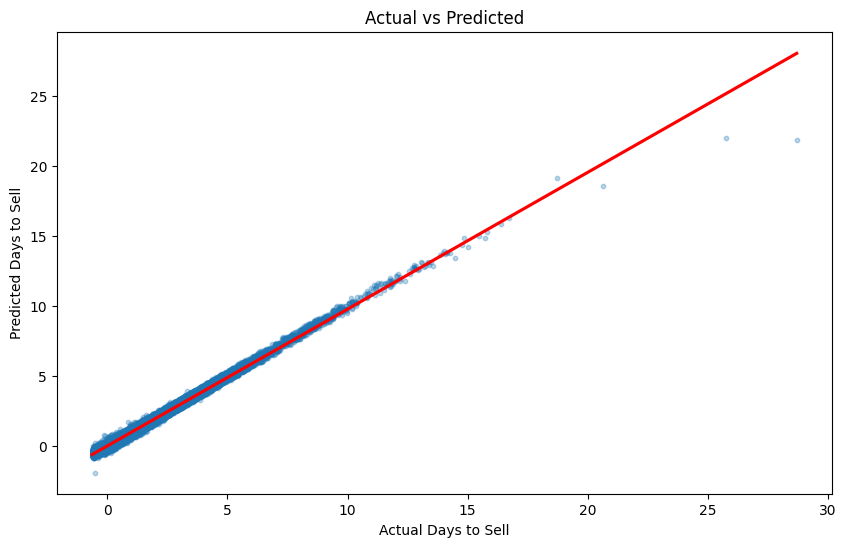

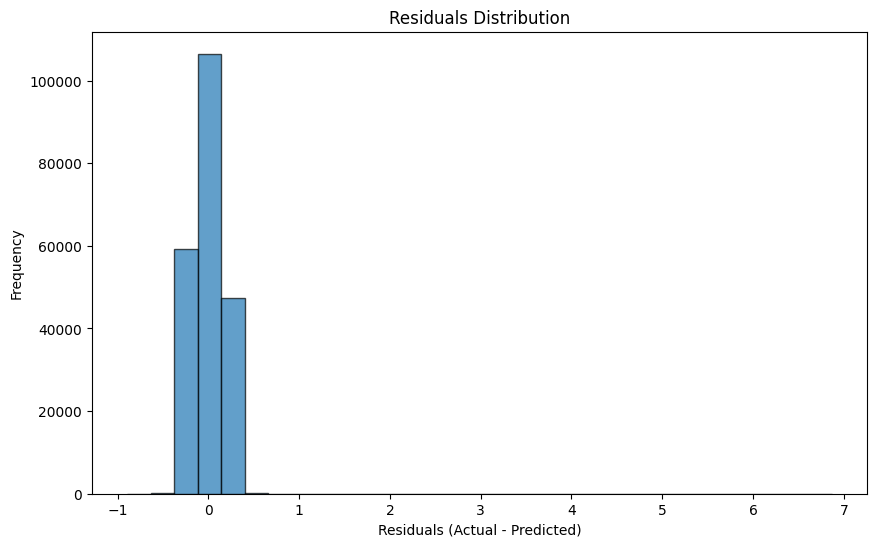

Residuals Summary Statistics:
count    213327.000000
mean         -0.002654
std           0.167454
min          -0.894813
25%          -0.135886
50%          -0.015486
75%           0.121477
max           6.866839
Name: days_to_sell, dtype: float64
Ensemble Model Metrics: 
MAE: 0.1394 
MSE: 0.0280 
R2: 0.9748 
Explained Variance: 0.9748


In [84]:
# ACTUAL AND PREDICTD BEING PLOTTED. INCLUDING LINE OF BEST FIT AS IT'S RELEVANT TO PERFORMANCE METRICS CALCULATIONS
plot_actual_vs_predicted(y, predictions)

# PLOTTING DISTRIBUTIONS OF RISIDUALS
residuals = y - predictions
plot_residuals_distribution(residuals)

print(f"Ensemble Model Metrics: \nMAE: {mae:.4f} \nMSE: {mse:.4f} \nR2: {r2:.4f} \nExplained Variance: {explained_var:.4f}")
